# ***IMPORTING THE NECESSARY LIBRARIES***

In [1]:
# Importing the drive moduls , giving the appropriate path where I have kept my dataset.

from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/MyDrive/Dissertation_Lloyds')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Importing all the necessary libraries which are later required.

import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf
from scipy.signal import periodogram
import numpy as np
from statsmodels.tsa.seasonal import STL

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA

from sklearn.ensemble import IsolationForest
from sklearn.metrics import f1_score, precision_score, recall_score,confusion_matrix
from sklearn.svm import OneClassSVM
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, RepeatVector, TimeDistributed,Input, Dropout
from keras.models import Model
from keras import regularizers

In [3]:
# Loading the data into the 'df' variable.
df = pd.read_csv('Lloyds_data.csv')

# Note to Instructors : Comment this out and try loading the data from your appropriate path onto the 'df' variable for smooth working lateron.

In [4]:
# Printing out the first 10 rows of the dataframe.
df.head(10)

,Unnamed: 0,individual_id,timestamp,date,day_of_week,hour_of_day,department,spend,at_risk_event,at_risk_behaviour_window
0,0,1,59:40.0,09/01/2023,Monday,11.994438,ops,2.10,False,NaN
1,1,1,10:02.9,11/01/2023,Wednesday,9.167461,ops,4.45,False,NaN
2,2,1,51:48.7,12/01/2023,Thursday,8.863522,ops,3.94,False,NaN
3,3,1,44:15.0,12/01/2023,Thursday,10.737514,ops,2.72,False,NaN
4,4,1,30:58.9,12/01/2023,Thursday,13.516375,ops,1.50,False,NaN
5,5,1,32:11.1,13/01/2023,Friday,9.536425,ops,3.02,False,NaN
6,6,1,13:59.5,15/01/2023,Sunday,15.233191,ops,8.14,True,NaN
7,7,1,58:00.8,16/01/2023,Monday,13.966903,ops,2.39,False,NaN
8,8,1,15:53.3,17/01/2023,Tuesday,9.264816,ops,9.22,False,NaN
9,9,1,53:02.0,18/01/2023,Wednesday,12.883891,ops,8.22,False,NaN


In [5]:
# Visualising the shape of the data.
df.shape

(105277, 10)

# ***PREPROCESSING***

In [6]:
# Checking whether any null values are present in our columns.
df.isna().sum()

Unnamed: 0                       0
individual_id                    0
timestamp                        0
date                             0
day_of_week                      0
hour_of_day                      0
department                       0
spend                            0
at_risk_event                    0
at_risk_behaviour_window    101229
dtype: int64

In [7]:
# Printing out the columns.
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window'],
      dtype='object')

In [8]:
# Printing out the number of unique values every column has.
df.nunique()

Unnamed: 0                  105277
individual_id                 2185
timestamp                    34089
date                           111
day_of_week                      7
hour_of_day                 105275
department                      20
spend                         7912
at_risk_event                    2
at_risk_behaviour_window       909
dtype: int64

In [9]:
# Finding out the number of records where the spend column value is zero.
df[df['spend'] == 0].shape

(35, 10)

In [10]:
df.shape

(105277, 10)

In [11]:
# Dropping those rows from the dataframe altogether and reseting the indices , giving an updated dataframe.

df.drop(df[df['spend'] == 0].index, inplace=True)
df.reset_index(drop=True, inplace=True)

In [12]:
df

,Unnamed: 0,individual_id,timestamp,date,day_of_week,hour_of_day,department,spend,at_risk_event,at_risk_behaviour_window
0,0,1,59:40.0,09/01/2023,Monday,11.994438,ops,2.10,False,NaN
1,1,1,10:02.9,11/01/2023,Wednesday,9.167461,ops,4.45,False,NaN
2,2,1,51:48.7,12/01/2023,Thursday,8.863522,ops,3.94,False,NaN
3,3,1,44:15.0,12/01/2023,Thursday,10.737514,ops,2.72,False,NaN
4,4,1,30:58.9,12/01/2023,Thursday,13.516375,ops,1.50,False,NaN
...,...,...,...,...,...,...,...,...,...,...
105237,105272,2184,20:57.3,20/04/2023,Thursday,12.349245,finance,8.91,False,NaN
105238,105273,2184,12:27.8,21/04/2023,Friday,10.207728,finance,20.24,False,NaN
105239,105274,2184,24:52.3,24/04/2023,Monday,17.414535,finance,12.25,False,NaN
105240,105275,2185,50:15.0,08/02/2023,Wednesday,12.837514,investor_relations,15.68,False,NaN


In [13]:
# Printing the new shape of the updated dataframe.
df.shape

(105242, 10)

In [14]:
# Printing out the distinct days alongside its value count.
df.day_of_week.value_counts()

day_of_week
Monday       21567
Wednesday    21531
Tuesday      21502
Thursday     21335
Friday       14086
Saturday      3104
Sunday        2117
Name: count, dtype: int64

In [15]:
#  Printing out the unique departments alongside its number of occurences overall in the data.
df.department.value_counts()

department
legal                 10004
production             9626
marketing              8896
sales                  7821
ops                    7622
quality_assurance      7448
accounting             6708
finance                6136
human_resources        5789
risk                   5524
technology             5380
it                     4883
strategy               4329
sourcing               4083
development            2565
secretariat            2327
general                2110
investor_relations     1727
exec                   1183
product_management     1081
Name: count, dtype: int64

# ***EXPLORATORY DATA ANALYSIS***




## ***ANALYSING THE TIME SERIES NATURE***

In [16]:
###################################  IMPORTANT POINT TO NOTE ###################################

# The resolution and sizes of the plots including the labels below are scaled up for the same in the report.

In [17]:
# converting the date to datetime format for easy usage later point using appropriate formatting technique.
# This format is used on visualising the date column in the dataframe.

df['date'] = pd.to_datetime(df['date'],format='%d/%m/%Y')

In [18]:
# constructing the pivot table.
pivot_table = pd.pivot_table(df, values='spend', index='date', columns='individual_id', aggfunc=np.sum, fill_value=0)
pivot_table

individual_id,1,2,3,4,5,6,7,8,9,10,...,2176,2177,2178,2179,2180,2181,2182,2183,2184,2185
date,,,,,,,,,,,,,,,,,,,,,
2023-01-09,2.10,0.00,0.00,3.15,0.0,1.12,0.00,0.0,0.0,15.51,...,4.05,0.00,2.33,2.23,2.02,0.0,6.56,3.41,3.07,0.0
2023-01-10,0.00,0.00,0.00,0.00,0.0,0.00,4.88,0.0,0.0,0.66,...,4.26,19.84,0.00,0.00,0.00,0.0,5.92,0.00,5.03,0.0
2023-01-11,4.45,2.47,2.37,3.36,0.0,0.00,9.05,0.0,0.0,0.00,...,3.89,0.59,14.21,0.00,0.00,0.0,5.52,0.00,0.00,0.0
2023-01-12,8.16,0.00,1.01,4.39,0.0,0.00,0.00,0.0,0.0,0.00,...,0.00,9.65,0.00,7.60,4.07,0.0,26.20,0.00,1.56,0.0
2023-01-13,3.02,0.00,0.00,20.23,0.0,7.14,13.02,0.0,0.0,0.00,...,6.26,11.38,0.00,0.00,0.00,0.0,48.02,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-25,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,3.70,...,0.00,0.00,0.00,0.00,0.00,0.0,20.26,0.00,0.00,0.0
2023-04-26,1.51,1.13,0.00,24.99,0.0,0.00,0.00,0.0,0.0,0.00,...,8.58,0.00,0.00,3.94,0.00,0.0,14.07,0.00,0.00,0.0
2023-04-27,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,...,20.39,0.00,0.00,0.00,0.00,0.0,10.52,0.00,0.00,0.0


In [19]:
df.date.value_counts()

date
2023-02-02    1485
2023-02-13    1465
2023-01-24    1451
2023-01-10    1446
2023-02-22    1444
              ... 
2023-03-12     115
2023-01-22     111
2023-01-15      95
2023-04-29      57
2023-04-30      44
Name: count, Length: 111, dtype: int64

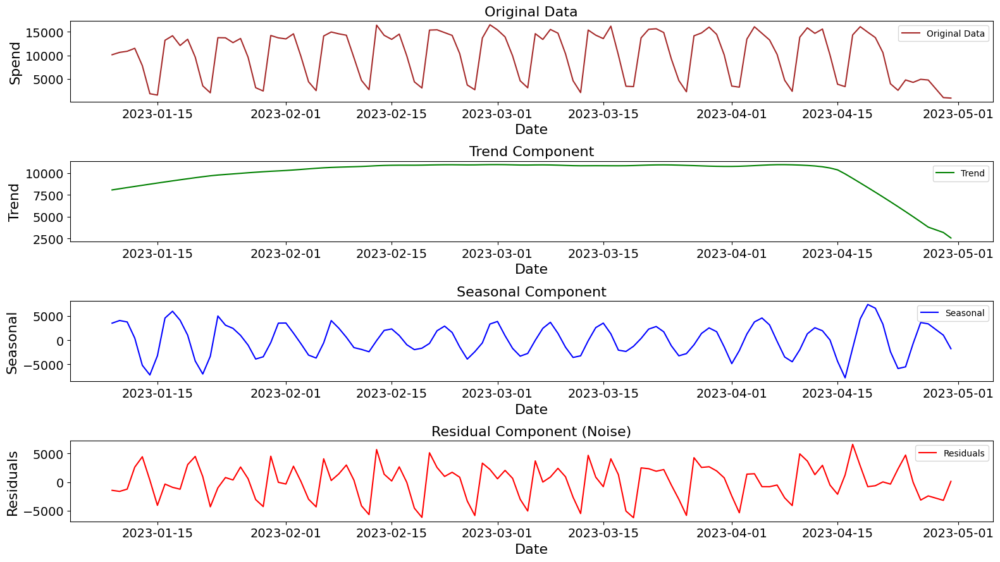

In [20]:
# This code performs Seasonal Decomposition of Time Series (STL) on aggregated expenditure data where period is set as 15.
# It groups the data by date and sums the expenditure ('spend'), decomposes the time series into trend, seasonal, and residual components,
# and then plots these components along with the original data for optimal visualisation.

# Getting the aggregated dataframe.
df_agg = df.groupby('date').agg({'spend': 'sum'}).reset_index()

# Perform Seasonal Decomposition (STL)
stl = STL(df_agg['spend'], period = 15)  # seasonal period chosen as 13 for monthly data

res = stl.fit()

# Plot original data, trend, seasonal, and residuals
plt.figure(figsize=(16,9))

# Original data
plt.subplot(4, 1, 1)
plt.plot(df_agg['date'], df_agg['spend'], label='Original Data',color = 'brown')
plt.title('Original Data',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Spend',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Trend component
plt.subplot(4, 1, 2)
plt.plot(df_agg['date'], res.trend, label='Trend', color = 'green')
plt.title('Trend Component',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Trend',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Seasonal component
plt.subplot(4, 1, 3)
plt.plot(df_agg['date'], res.seasonal, label='Seasonal', color = 'blue')
plt.title('Seasonal Component',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Seasonal',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Residual component (noise)
plt.subplot(4, 1, 4)
plt.plot(df_agg['date'], res.resid, label='Residuals' , color = 'red')
plt.title('Residual Component (Noise)',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Residuals',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

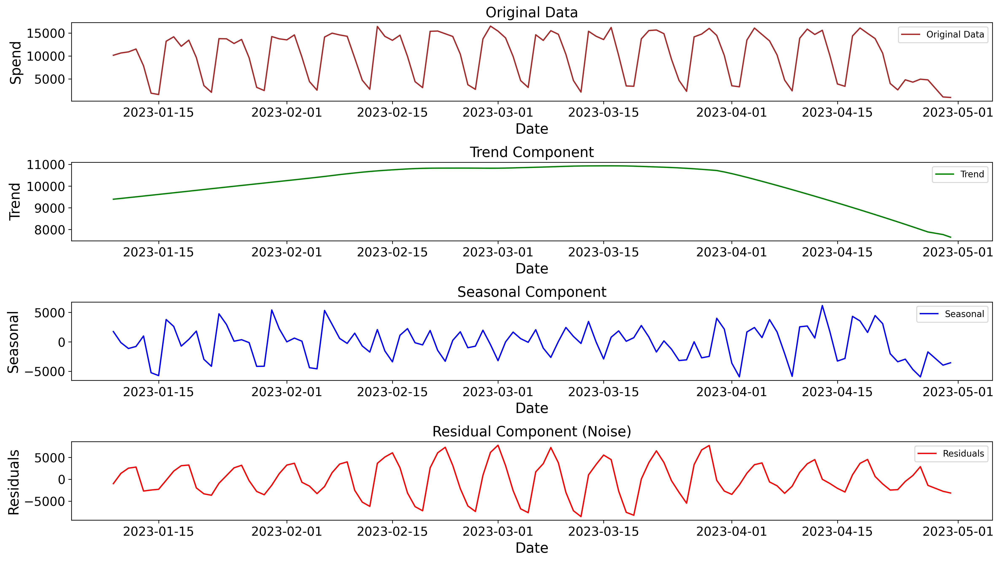

In [21]:
# This code performs Seasonal Decomposition of Time Series (STL) on aggregated expenditure data where period is set as 31.
# It groups the data by date and sums the expenditure ('spend'), decomposes the time series into trend, seasonal, and residual components,
# and then plots these components along with the original data for optimal visualisation.

# Fetching the aggregated dataframe.
df_agg = df.groupby('date').agg({'spend': 'sum'}).reset_index()

# Perform Seasonal Decomposition (STL)
stl = STL(df_agg['spend'], period = 31)  # seasonal period chosen as 13 for monthly data

res = stl.fit()

# Plot original data, trend, seasonal, and residuals
plt.figure(figsize=(16,9), dpi = 300)

# Original data
plt.subplot(4, 1, 1)
plt.plot(df_agg['date'], df_agg['spend'], label='Original Data', color = 'brown')
plt.title('Original Data',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Spend',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Trend component
plt.subplot(4, 1, 2)
plt.plot(df_agg['date'], res.trend, label='Trend', color = 'green')
plt.title('Trend Component',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Trend',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Seasonal component
plt.subplot(4, 1, 3)
plt.plot(df_agg['date'], res.seasonal, label='Seasonal', color = 'blue')
plt.title('Seasonal Component',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Seasonal',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Residual component (noise)
plt.subplot(4, 1, 4)
plt.plot(df_agg['date'], res.resid, label='Residuals', color = 'red')
plt.title('Residual Component (Noise)',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.ylabel('Residuals',fontsize=16)
plt.legend()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.tight_layout()
plt.show()

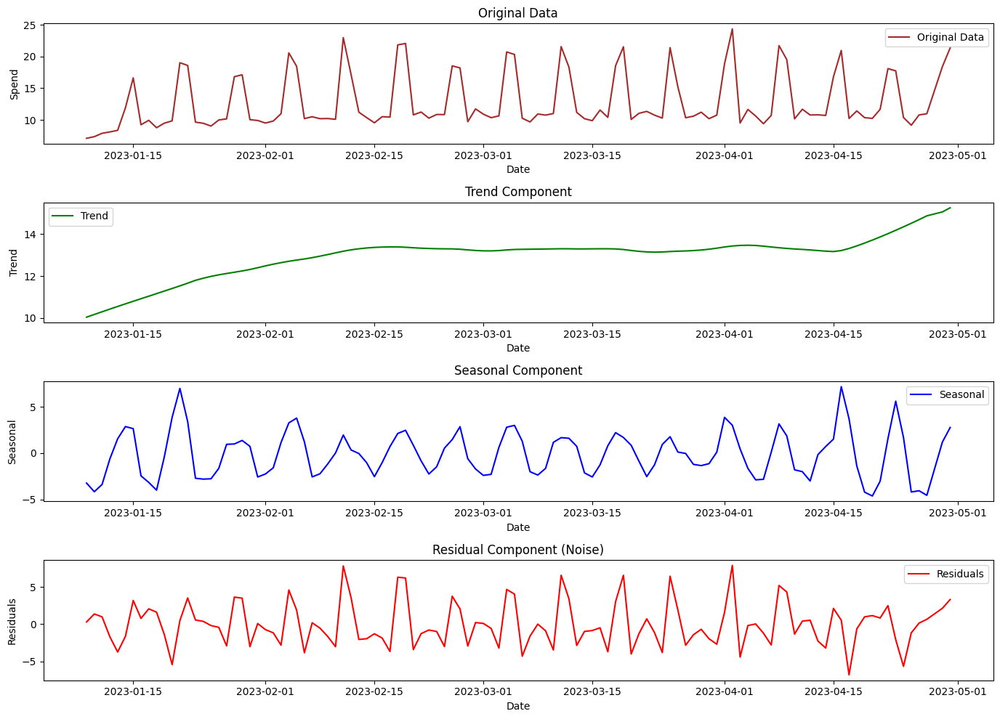

In [22]:
# This code performs Seasonal Decomposition of Time Series (STL) on the mean expenditure ('spend') data over the period = 15.
# It groups the data by date and calculates the mean expenditure, decomposes the time series into trend, seasonal, and residual components,
# and then plots these components along with the original data for better visualization and analysis.

# Fetching the appropriate aggregated dataframe.
df_agg = df.groupby('date').agg({'spend': 'mean'}).reset_index()

# Perform Seasonal Decomposition (STL)
stl = STL(df_agg['spend'], period = 15)  # seasonal period chosen as 13 for monthly data

res = stl.fit()

# Plot original data, trend, seasonal, and residuals
plt.figure(figsize=(14, 10))

# Original data
plt.subplot(4, 1, 1)
plt.plot(df_agg['date'], df_agg['spend'], label='Original Data', color = 'brown')
plt.title('Original Data')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

# Trend component
plt.subplot(4, 1, 2)
plt.plot(df_agg['date'], res.trend, label='Trend', color ='green')
plt.title('Trend Component')
plt.xlabel('Date')
plt.ylabel('Trend')
plt.legend()

# Seasonal component
plt.subplot(4, 1, 3)
plt.plot(df_agg['date'], res.seasonal, label='Seasonal', color = 'blue')
plt.title('Seasonal Component')
plt.xlabel('Date')
plt.ylabel('Seasonal')
plt.legend()

# Residual component (noise)
plt.subplot(4, 1, 4)
plt.plot(df_agg['date'], res.resid, label='Residuals', color = 'red')
plt.title('Residual Component (Noise)')
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.legend()

plt.tight_layout()
plt.show()

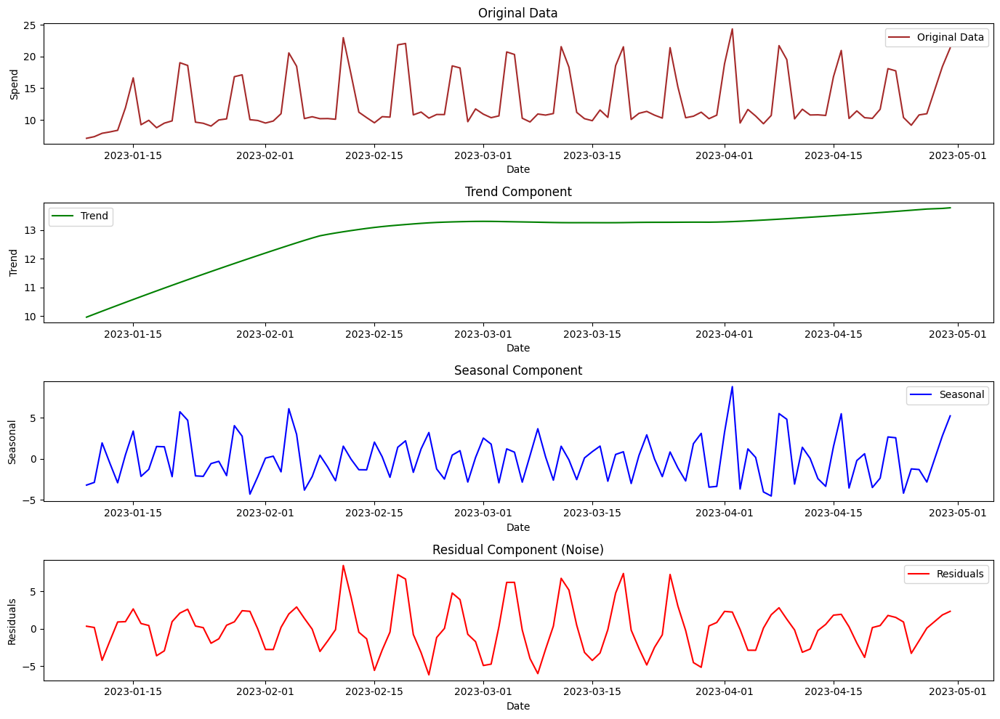

In [23]:
# This code performs Seasonal Decomposition of Time Series (STL) on the mean expenditure ('spend') data over the period = 31.
# It groups the data by date and calculates the mean expenditure, decomposes the time series into trend, seasonal, and residual components,
# and then plots these components along with the original data for better visualization and analysis.

# Fetching the appropriate aggregated dataframe based on the desired metric.
df_agg = df.groupby('date').agg({'spend': 'mean'}).reset_index()

# Perform Seasonal Decomposition (STL)
stl = STL(df_agg['spend'], period = 31)  # seasonal period chosen as 13 for monthly data

res = stl.fit()

# Plot original data, trend, seasonal, and residuals
plt.figure(figsize=(14, 10))

# Original data
plt.subplot(4, 1, 1)
plt.plot(df_agg['date'], df_agg['spend'], label='Original Data', color = 'brown')
plt.title('Original Data')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

# Trend component
plt.subplot(4, 1, 2)
plt.plot(df_agg['date'], res.trend, label='Trend', color ='green')
plt.title('Trend Component')
plt.xlabel('Date')
plt.ylabel('Trend')
plt.legend()

# Seasonal component
plt.subplot(4, 1, 3)
plt.plot(df_agg['date'], res.seasonal, label='Seasonal', color = 'blue')
plt.title('Seasonal Component')
plt.xlabel('Date')
plt.ylabel('Seasonal')
plt.legend()

# Residual component (noise)
plt.subplot(4, 1, 4)
plt.plot(df_agg['date'], res.resid, label='Residuals', color = 'red')
plt.title('Residual Component (Noise)')
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.legend()

plt.tight_layout()
plt.show()

## ***ANALYSING THE 'SPEND' COLUMN***

In [24]:
# Fetching the minimum and maximum of 'spend' column
df.spend.min(),df.spend.max()

(0.01, 180.83)

In [25]:
df.spend

0          2.10
1          4.45
2          3.94
3          2.72
4          1.50
          ...  
105237     8.91
105238    20.24
105239    12.25
105240    15.68
105241     1.43
Name: spend, Length: 105242, dtype: float64

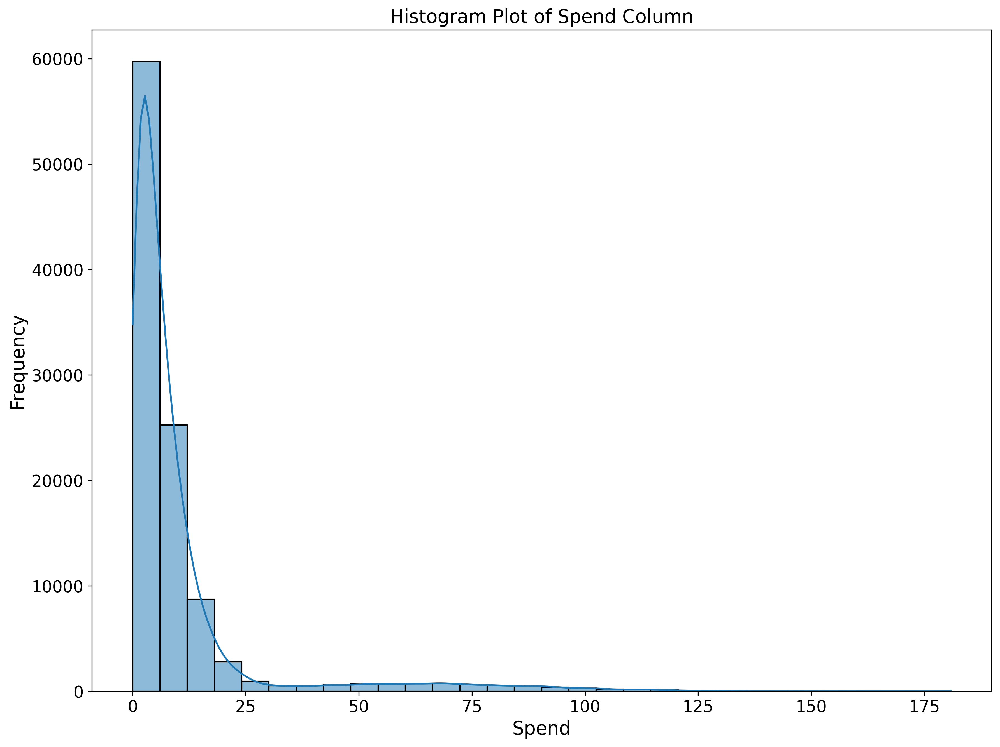

In [26]:
# Histogram plot to understand the distribution of 'spend' feature column.

#Figure Size
plt.figure(figsize=(12, 9), dpi=300)
sns.histplot(df['spend'], bins=30, kde=True)
plt.title('Histogram Plot of Spend Column', fontsize=16) # Adding a appropriate title.
plt.xlabel('Spend', fontsize=16) # Labeling the X axis.
plt.ylabel('Frequency', fontsize=16) # Labeling the Y axis.
plt.xticks(fontsize=14) # Setting the size of the X axis values.
plt.yticks(fontsize=14) # Setting the size of the Y axis values.
plt.tight_layout()  # Adjust layout to prevent clipping

In [27]:
# Scaling the spend feature column.
scaler = StandardScaler()
df['scaled_spend'] = scaler.fit_transform(df[['spend']])

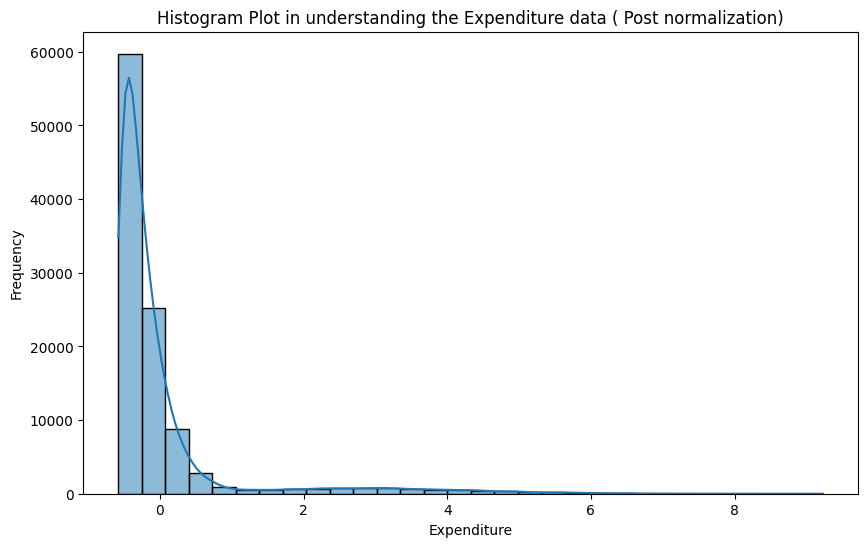

In [28]:
# Histogram plot in observing the nature of the scaled spend.

plt.figure(figsize=(10, 6))
sns.histplot(df['scaled_spend'], bins=30, kde=True)
plt.title(f'Histogram Plot in understanding the Expenditure data ( Post normalization)')
plt.xlabel('Expenditure')
plt.ylabel('Frequency')
plt.show()

In [29]:
df.scaled_spend.min(),df.scaled_spend.max()

(-0.5780521365755719, 9.229344280103259)

In [30]:
df['spend'].describe() , df['scaled_spend'].describe()

(count    105242.000000
 mean         10.667608
 std          18.437193
 min           0.010000
 25%           2.210000
 50%           5.030000
 75%           9.990000
 max         180.830000
 Name: spend, dtype: float64,
 count    1.052420e+05
 mean     3.024678e-17
 std      1.000005e+00
 min     -5.780521e-01
 25%     -4.587275e-01
 50%     -3.057751e-01
 75%     -3.675241e-02
 max      9.229344e+00
 Name: scaled_spend, dtype: float64)

In [31]:


#######.      INSIGHT MADE ########################

# log transformation --- negative values , and scaling does not help in any sense either... thus it is better to keep it as such...

# since it is a time series data , it is improper to perform any kind of transformations , thus , spend as such would be proper ...




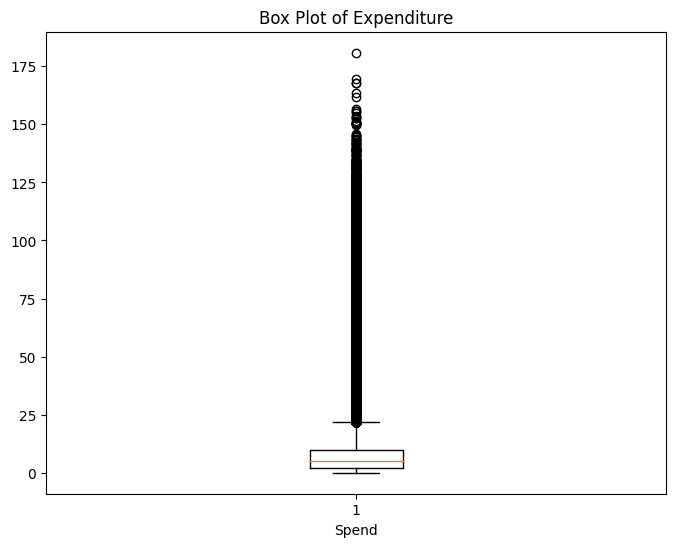

In [32]:
# Visualising the box plot of expenditure.

plt.figure(figsize=(8, 6))
plt.boxplot(df['spend'])
plt.title('Box Plot of Expenditure')
plt.xlabel('Spend')
plt.show()

In [33]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend'],
      dtype='object')

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105242 entries, 0 to 105241
Data columns (total 11 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   Unnamed: 0                105242 non-null  int64         
 1   individual_id             105242 non-null  int64         
 2   timestamp                 105242 non-null  object        
 3   date                      105242 non-null  datetime64[ns]
 4   day_of_week               105242 non-null  object        
 5   hour_of_day               105242 non-null  float64       
 6   department                105242 non-null  object        
 7   spend                     105242 non-null  float64       
 8   at_risk_event             105242 non-null  bool          
 9   at_risk_behaviour_window  4048 non-null    float64       
 10  scaled_spend              105242 non-null  float64       
dtypes: bool(1), datetime64[ns](1), float64(4), int64(2), object(3)
me

### ***INDIVIDUAL WISE ANALYSIS***

***TOP 10 CONTRIBUTING INDIVIDUALS (BASED ON NUMBER OF TRANSACTIONS)***

In [35]:
df.individual_id.value_counts()

individual_id
213     269
1985    241
2182    234
1358    232
561     229
       ... 
1703      1
34        1
376       1
457       1
1618      1
Name: count, Length: 2185, dtype: int64

In [36]:
df.individual_id.min() , df.individual_id.max()

(1, 2185)

In [37]:
dictie = dict(df.individual_id.value_counts())

In [38]:
# Sort the dictionary by values and get top 10 individuals
top_10_individuals = {k:v for k, v in sorted(dictie.items(), key=lambda item: item[1], reverse=True)[:10]}

top_10 = list(top_10_individuals.keys())

In [39]:
top_10

[213, 1985, 2182, 1358, 561, 2120, 1548, 422, 1613, 1115]

In [40]:
df_one = df[df['individual_id'] == 213]
df_two = df[df['individual_id'] == 1985]
df_three = df[df['individual_id'] == 2182]

df_four = df[df['individual_id'] == 1358]
df_five = df[df['individual_id'] == 561]
df_six = df[df['individual_id'] == 2120]


In [41]:
df_three[df_three['at_risk_event'] == True]

,Unnamed: 0,individual_id,timestamp,date,day_of_week,hour_of_day,department,spend,at_risk_event,at_risk_behaviour_window,scaled_spend
104939,104972,2182,20:20.1,2023-01-18,Wednesday,19.338911,sourcing,2.86,True,NaN,-0.423473
104942,104975,2182,57:50.2,2023-01-21,Saturday,15.963958,sourcing,2.60,True,908.0,-0.437575
105071,105104,2182,06:29.7,2023-03-20,Monday,21.108247,sourcing,62.81,True,NaN,2.828122


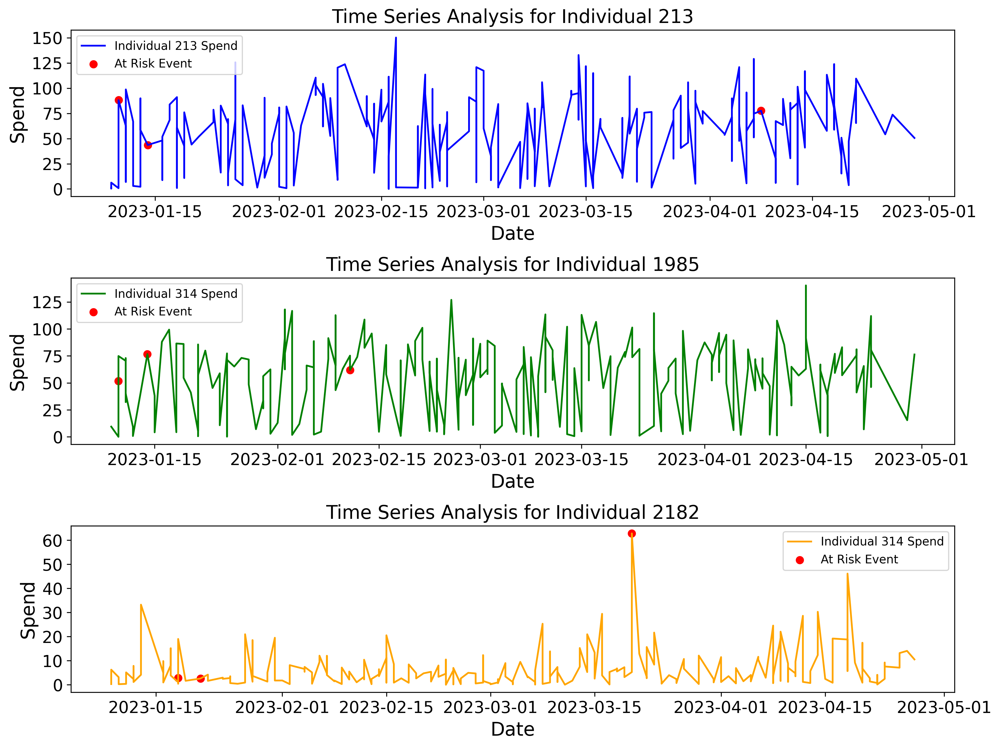

In [42]:
plt.figure(figsize=(12,9),dpi = 300)

# Individual 1
plt.subplot(3, 1, 1)
plt.plot(df_one['date'], df_one['spend'], label='Individual 213 Spend', color='blue')
plt.scatter(df_one[df_one['at_risk_event']]['date'], df_one[df_one['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 213', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Spend', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend()

# Individual 2
plt.subplot(3, 1, 2)
plt.plot(df_two['date'], df_two['spend'], label='Individual 314 Spend', color='green')
plt.scatter(df_two[df_two['at_risk_event']]['date'], df_two[df_two['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 1985', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Spend', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend()

# Individual 3
plt.subplot(3, 1, 3)
plt.plot(df_three['date'], df_three['spend'], label='Individual 314 Spend', color='orange')
plt.scatter(df_three[df_three['at_risk_event']]['date'], df_three[df_three['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 2182', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Spend', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend()

plt.tight_layout()
plt.show()

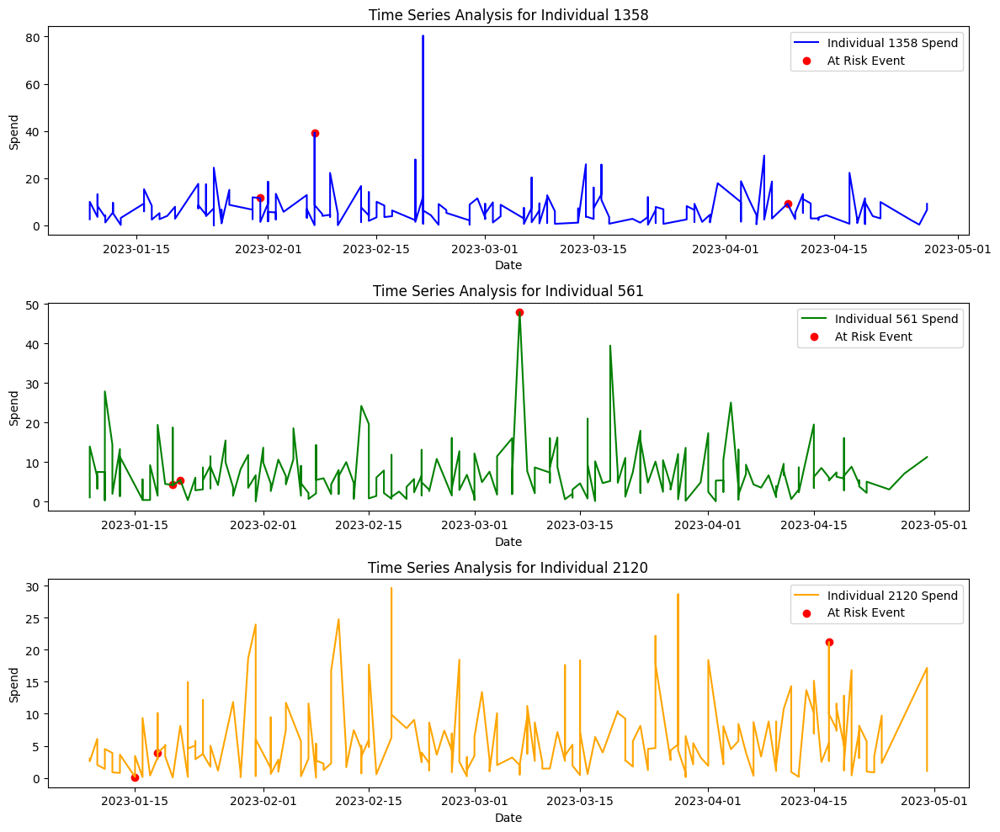

In [43]:
plt.figure(figsize=(12, 10))

# Individual 4
plt.subplot(3, 1, 1)
plt.plot(df_four['date'], df_four['spend'], label='Individual 1358 Spend', color='blue')
plt.scatter(df_four[df_four['at_risk_event']]['date'], df_four[df_four['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 1358')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

# Individual 5
plt.subplot(3, 1, 2)
plt.plot(df_five['date'], df_five['spend'], label='Individual 561 Spend', color='green')
plt.scatter(df_five[df_five['at_risk_event']]['date'], df_five[df_five['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 561')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

# Individual 6
plt.subplot(3, 1, 3)
plt.plot(df_six['date'], df_six['spend'], label='Individual 2120 Spend', color='orange')
plt.scatter(df_six[df_six['at_risk_event']]['date'], df_six[df_six['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 2120')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

plt.tight_layout()
plt.show()

***TOP 10 CONTRIBUTING INDIVIDUALS (BASED ON EXPENDITURE)***

In [44]:

individual_spend = df.groupby('individual_id')['spend'].sum()
top_10_individuals = individual_spend.sort_values(ascending=False).head(10)

print(top_10_individuals)

individual_id
213     15329.94
1985    13127.46
951     11539.42
847     10451.61
1115    10360.93
1451     9889.71
974      9631.29
733      9523.86
188      9329.37
1296     8786.77
Name: spend, dtype: float64


In [45]:
spend_one = df[df['individual_id'] == 951]
spend_two = df[df['individual_id'] == 847]
spend_three = df[df['individual_id'] == 1115]

spend_four = df[df['individual_id'] == 1451]
spend_five = df[df['individual_id'] == 974]
spend_six = df[df['individual_id'] == 733]

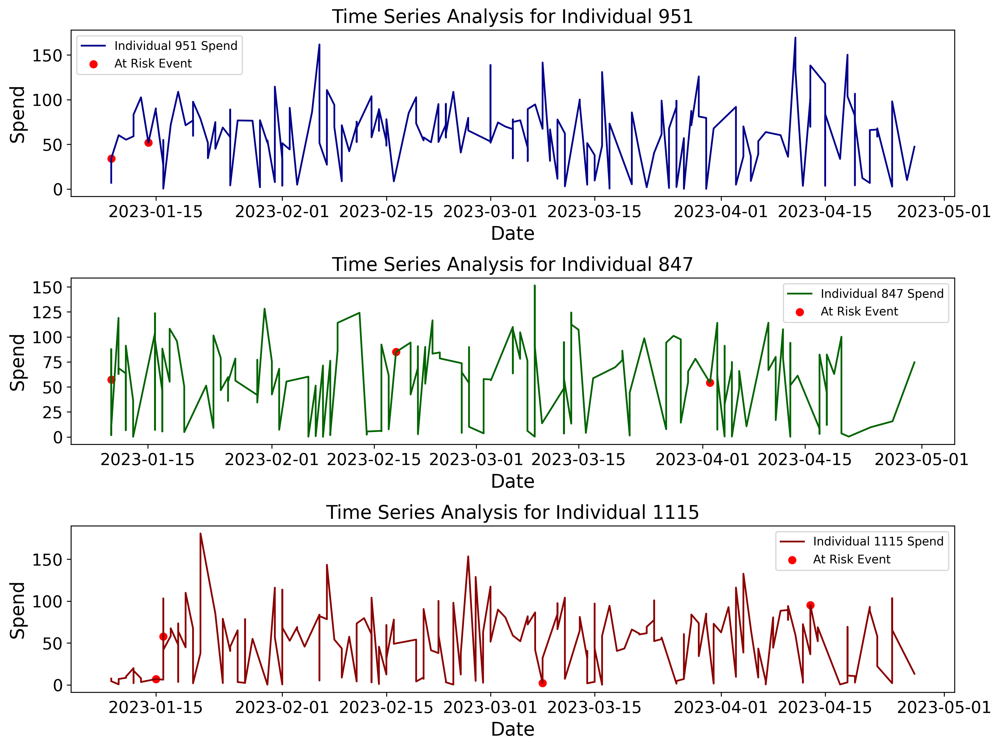

In [46]:
plt.figure(figsize=(12, 9), dpi = 300)

# Individual 1
plt.subplot(3, 1, 1)
plt.plot(spend_one['date'], spend_one['spend'], label='Individual 951 Spend', color='darkblue')
plt.scatter(spend_one[spend_one['at_risk_event']]['date'], spend_one[spend_one['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 951', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Spend', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend()

# Individual 2
plt.subplot(3, 1, 2)
plt.plot(spend_two['date'], spend_two['spend'], label='Individual 847 Spend', color='darkgreen')
plt.scatter(spend_two[spend_two['at_risk_event']]['date'], spend_two[spend_two['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 847', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Spend', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend()

# Individual 3
plt.subplot(3, 1, 3)
plt.plot(spend_three['date'], spend_three['spend'], label='Individual 1115 Spend', color='darkred')
plt.scatter(spend_three[spend_three['at_risk_event']]['date'], spend_three[spend_three['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 1115', fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Spend', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend()

plt.tight_layout()
plt.show()

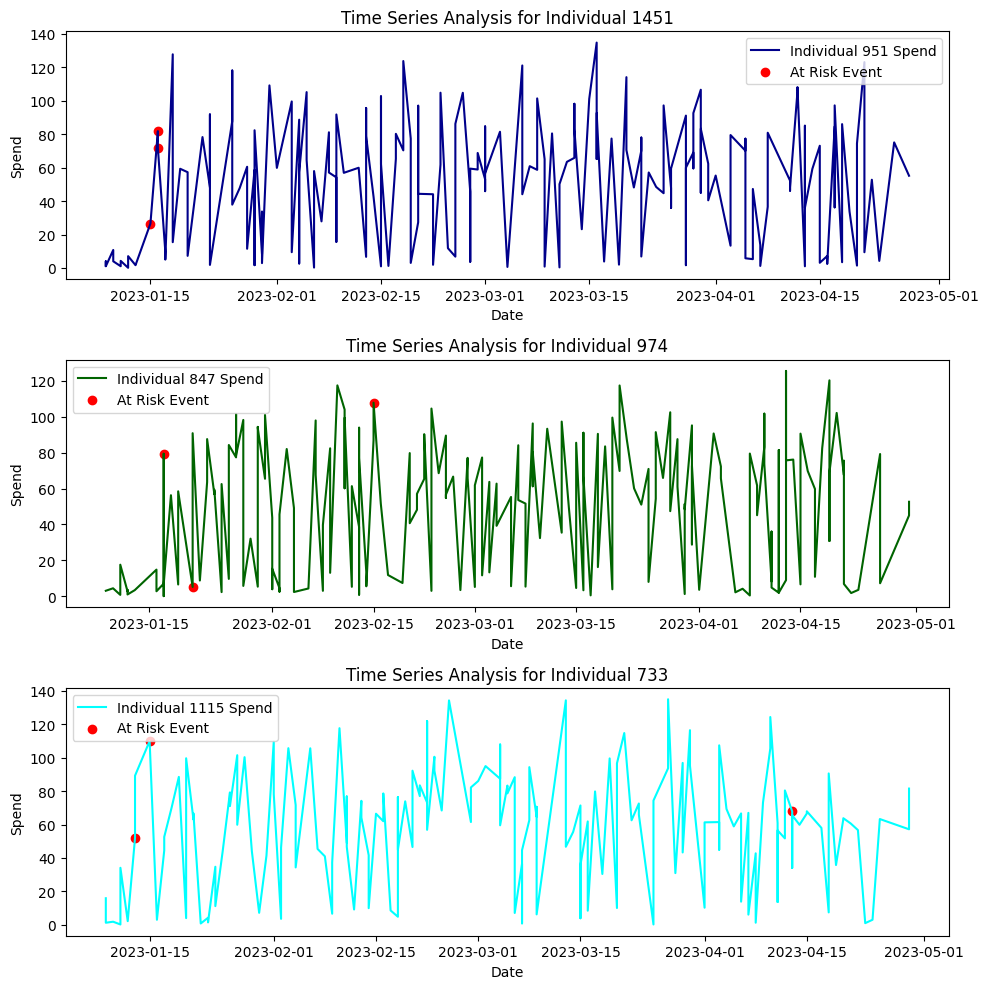

In [47]:
plt.figure(figsize=(10, 10))

# Individual 4
plt.subplot(3, 1, 1)
plt.plot(spend_four['date'], spend_four['spend'], label='Individual 951 Spend', color='darkblue')
plt.scatter(spend_four[spend_four['at_risk_event']]['date'], spend_four[spend_four['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 1451')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

# Individual 5
plt.subplot(3, 1, 2)
plt.plot(spend_five['date'], spend_five['spend'], label='Individual 847 Spend', color='darkgreen')
plt.scatter(spend_five[spend_five['at_risk_event']]['date'], spend_five[spend_five['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 974')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

# Individual 6
plt.subplot(3, 1, 3)
plt.plot(spend_six['date'], spend_six['spend'], label='Individual 1115 Spend', color='cyan')
plt.scatter(spend_six[spend_six['at_risk_event']]['date'], spend_six[spend_six['at_risk_event']]['spend'], color='red', label='At Risk Event')
plt.title('Time Series Analysis for Individual 733')
plt.xlabel('Date')
plt.ylabel('Spend')
plt.legend()

plt.tight_layout()
plt.show()

In [48]:
df.at_risk_event.value_counts()

at_risk_event
False    102471
True       2771
Name: count, dtype: int64

In [49]:
'''

-> The above time series plots are plotted for the top 6 individuals (based on the number of transactions and then on expenditure)..

-> Line plot seem to be fine and we could properly conclude on the fact that there is no periodicity factor out here..

-> every line plot when plotted for every invidiual over the time seems irregular..

-> Expenditure plot is plotted and a general trend is observed on the top performing individuals..

-> Later point , when the risk events are plotted on the same graphs , we could deduce something interesting..

-> No general conclusion could be made that , the higher expense (spend) would correspond to a risk event...

-> It might be a factor (i.e) There is a high probability that the transaction could be a risk event , but not a sure one...

-> because we could see some events to be modelled as risk events even when the expense is on an average scale or sometimes even lower than the average..

'''

'\n\n-> The above time series plots are plotted for the top 6 individuals (based on the number of transactions and then on expenditure)..\n\n-> Line plot seem to be fine and we could properly conclude on the fact that there is no periodicity factor out here..\n\n-> every line plot when plotted for every invidiual over the time seems irregular..\n\n-> Expenditure plot is plotted and a general trend is observed on the top performing individuals..\n\n-> Later point , when the risk events are plotted on the same graphs , we could deduce something interesting..\n\n-> No general conclusion could be made that , the higher expense (spend) would correspond to a risk event...\n\n-> It might be a factor (i.e) There is a high probability that the transaction could be a risk event , but not a sure one...\n\n-> because we could see some events to be modelled as risk events even when the expense is on an average scale or sometimes even lower than the average..\n\n'

## ***ANALYSING DEPARTMENT***

In [50]:
df.columns # Printing the columns of the dataframe.

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend'],
      dtype='object')

In [51]:
df.department.unique() # Printing out the names of the unique departments present.

array(['ops', 'finance', 'product_management', 'legal', 'risk',
       'development', 'quality_assurance', 'general', 'technology', 'it',
       'sourcing', 'marketing', 'production', 'sales', 'strategy',
       'accounting', 'human_resources', 'investor_relations', 'exec',
       'secretariat'], dtype=object)

<ipython-input-52-ac745da81f70>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=dept_counts.values, y=dept_counts.index, palette='viridis')


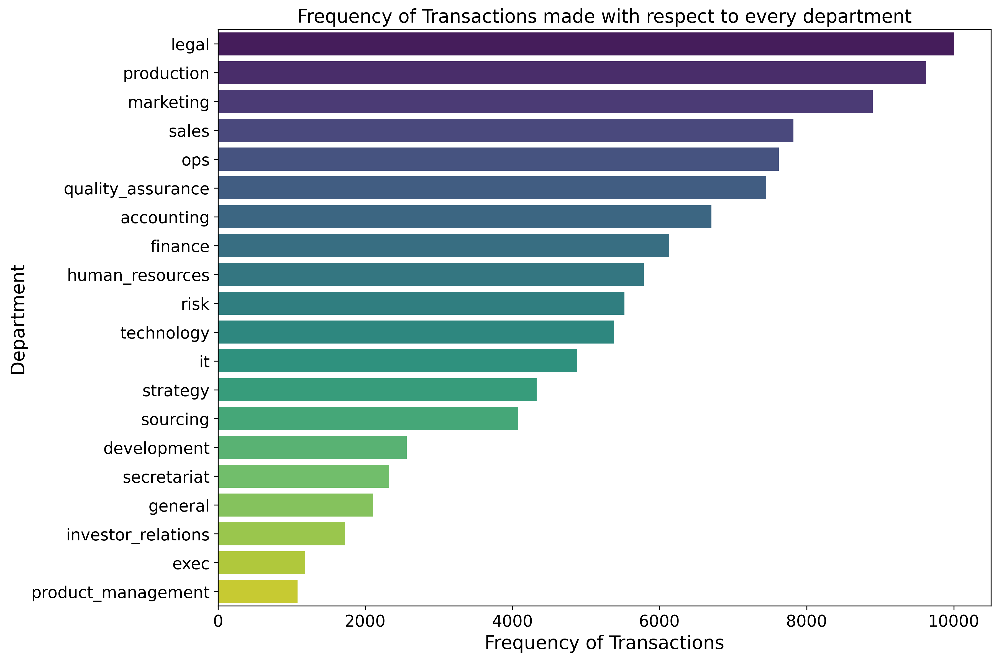

In [52]:
# Bar plot on visualising the number of aggregated transactions with respect to every department over the time period present.

# Fetching the counts of every department present.
dept_counts = df['department'].value_counts()
plt.figure(figsize=(12,9), dpi = 300) # Setting up the size of the bar plot.
sns.barplot(x=dept_counts.values, y=dept_counts.index, palette='viridis')
plt.title('Frequency of Transactions made with respect to every department', fontsize = 16) # Setting the title
plt.xlabel('Frequency of Transactions',fontsize = 16) # labeling the X axis.
plt.ylabel('Department',fontsize = 16) # Labeling the Y axis.
plt.xticks(fontsize=14) # Describing the size of the X axis numeric values.
plt.yticks(fontsize=14) # Describing the size of the Y axis numeric values.
plt.show()

In [53]:
# Aggregating the department counts and the number of associated risk events , thereby calculating the risk ratio as
# (Number of risk events / number of total transactions aggregated over the department).

department_counts = df.groupby('department')['at_risk_event'].count().reset_index(name='total_events')
risk_events = df.groupby('department')['at_risk_event'].sum().reset_index(name='risk_events')
department_counts = pd.merge(department_counts, risk_events, on='department')

# Calculating the risk ratio.
department_counts['risk_ratio'] = department_counts['risk_events'] / department_counts['total_events']

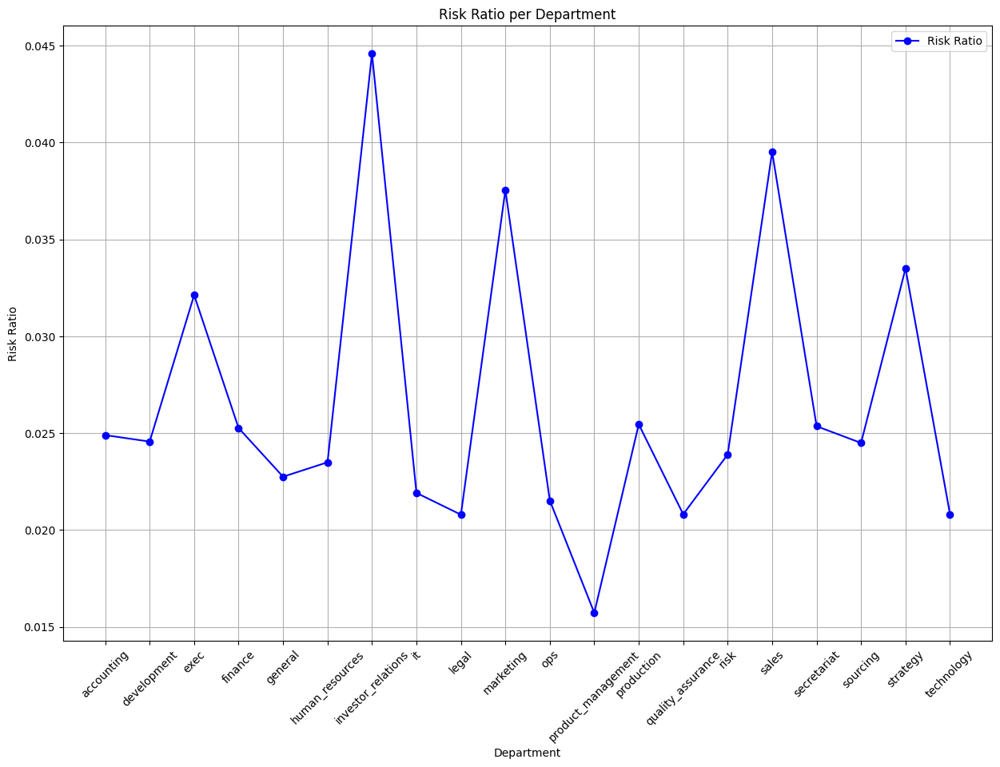

In [54]:
# Risk Ratio vs Department Line graph is plotted.
plt.figure(figsize=(15,10))
plt.plot(department_counts['department'], department_counts['risk_ratio'], marker='o', linestyle='-', color='b', label='Risk Ratio')
plt.title('Risk Ratio per Department')
plt.xlabel('Department')
plt.ylabel('Risk Ratio')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.show()

In [55]:
department_counts # Printing the department_counts variable.

,department,total_events,risk_events,risk_ratio
0,accounting,6708,167,0.024896
1,development,2565,63,0.024561
2,exec,1183,38,0.032122
3,finance,6136,155,0.025261
4,general,2110,48,0.022749
5,human_resources,5789,136,0.023493
6,investor_relations,1727,77,0.044586
7,it,4883,107,0.021913
8,legal,10004,208,0.020792
9,marketing,8896,334,0.037545


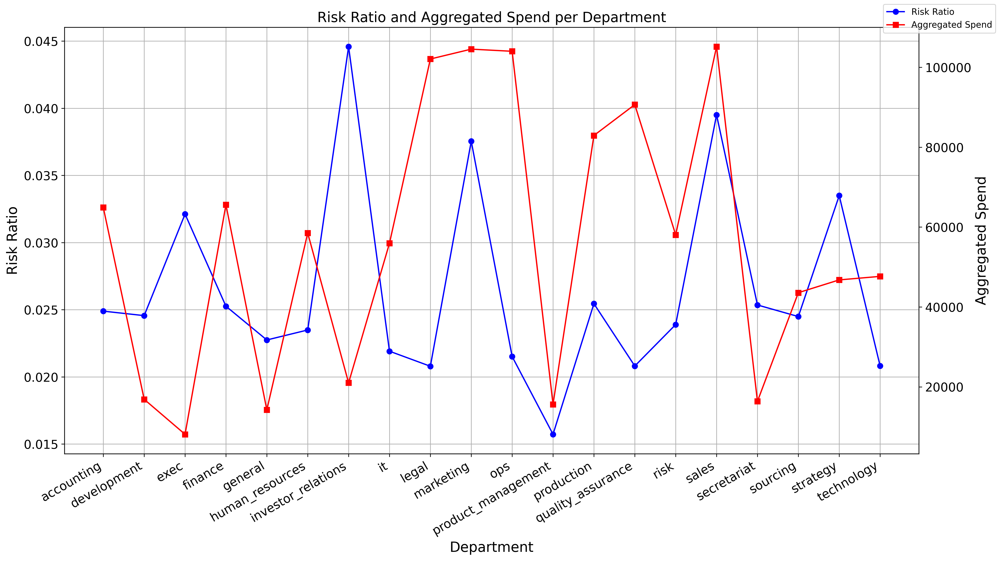

In [56]:
# Visualising the aggregated spend and risk ratio for every department present.

department_counts = df.groupby('department')['at_risk_event'].count().reset_index(name='total_events')
risk_events = df.groupby('department')['at_risk_event'].sum().reset_index(name='risk_events')
department_counts = pd.merge(department_counts, risk_events, on='department')

# Calculate risk ratio
department_counts['risk_ratio'] = department_counts['risk_events'] / department_counts['total_events']

# Calculate aggregated spend per department
department_spend = df.groupby('department')['spend'].sum().reset_index(name='total_spend')

# Merge spend data with department counts
department_counts = pd.merge(department_counts, department_spend, on='department')

# Plotting
fig, ax1 = plt.subplots(figsize=(16, 9), dpi=300)

# Plotting risk ratio
ax1.plot(department_counts['department'], department_counts['risk_ratio'], marker='o', linestyle='-', color='b', label='Risk Ratio')
ax1.set_xlabel('Department', fontsize=16)
ax1.set_ylabel('Risk Ratio', color='black', fontsize=16)
ax1.tick_params(axis='x', labelsize=14)
ax1.tick_params(axis='y', labelcolor='black', labelsize=14)
ax1.grid(True)

# Creating a second y-axis for aggregated spend
ax2 = ax1.twinx()
ax2.plot(department_counts['department'], department_counts['total_spend'], marker='s', linestyle='-', color='r', label='Aggregated Spend')
ax2.set_ylabel('Aggregated Spend', color='black', fontsize=16)
ax2.tick_params(axis='y', labelcolor='black', labelsize=14)

plt.setp(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')

# Title and legend
plt.title('Risk Ratio and Aggregated Spend per Department', fontsize=16)
fig.tight_layout()
fig.legend(loc='upper right')

plt.show()

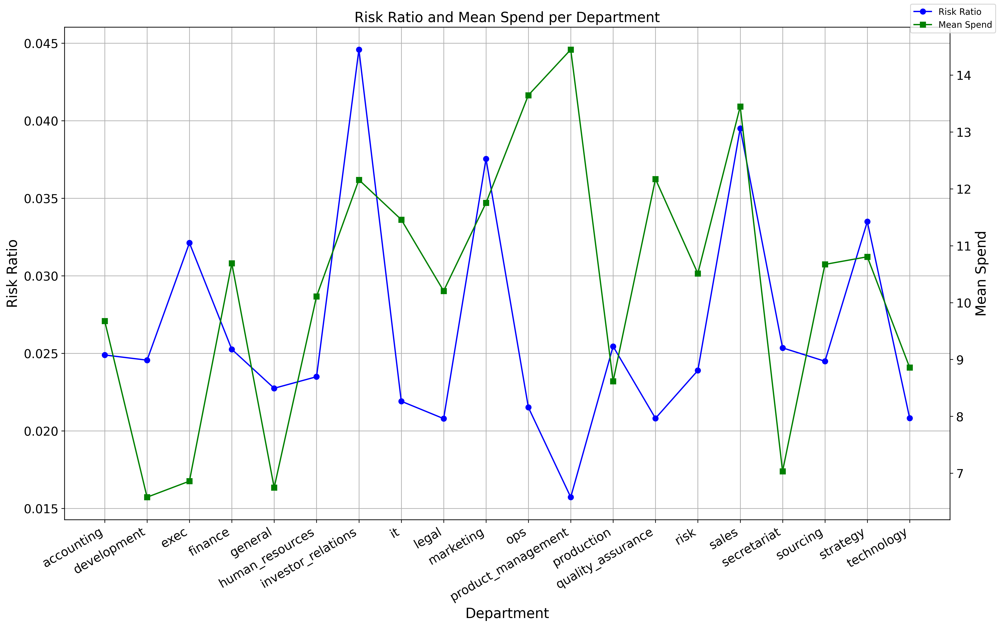

In [57]:
# Visualising the risk ratio and average spend for every department present.

# Calculate total events and risk events per department
department_counts = df.groupby('department')['at_risk_event'].count().reset_index(name='total_events')
risk_events = df.groupby('department')['at_risk_event'].sum().reset_index(name='risk_events')
department_counts = pd.merge(department_counts, risk_events, on='department')

# Calculate risk ratio
department_counts['risk_ratio'] = department_counts['risk_events'] / department_counts['total_events']

# Calculate mean spend per department
department_mean_spend = df.groupby('department')['spend'].mean().reset_index(name='mean_spend')

# Plotting
fig, ax1 = plt.subplots(figsize=(16,9), dpi = 300)

# Plotting risk ratio
ax1.plot(department_counts['department'], department_counts['risk_ratio'], marker='o', linestyle='-', color='b', label='Risk Ratio')
ax1.set_xlabel('Department',fontsize = 16)
ax1.set_ylabel('Risk Ratio', color='black',fontsize = 16)
ax1.tick_params(axis='x', labelsize=14)
ax1.tick_params(axis='y', labelcolor='black', labelsize=14)
ax1.grid(True)

# Creating a second y-axis for mean spend
ax2 = ax1.twinx()
ax2.plot(department_mean_spend['department'], department_mean_spend['mean_spend'], marker='s', linestyle='-', color='g', label='Mean Spend')
ax2.set_ylabel('Mean Spend', color='black',fontsize = 16)
ax2.tick_params(axis='y', labelcolor='black', labelsize=14)

# Title and legend
plt.title('Risk Ratio and Mean Spend per Department',fontsize = 16)
fig.tight_layout()
fig.legend(loc='upper right')


plt.setp(ax1.get_xticklabels(), rotation=30, horizontalalignment='right')
# Rotate and adjust x-axis labels
plt.xticks(rotation=45, ha='right')  # Rotate labels and align them to the right

plt.show()

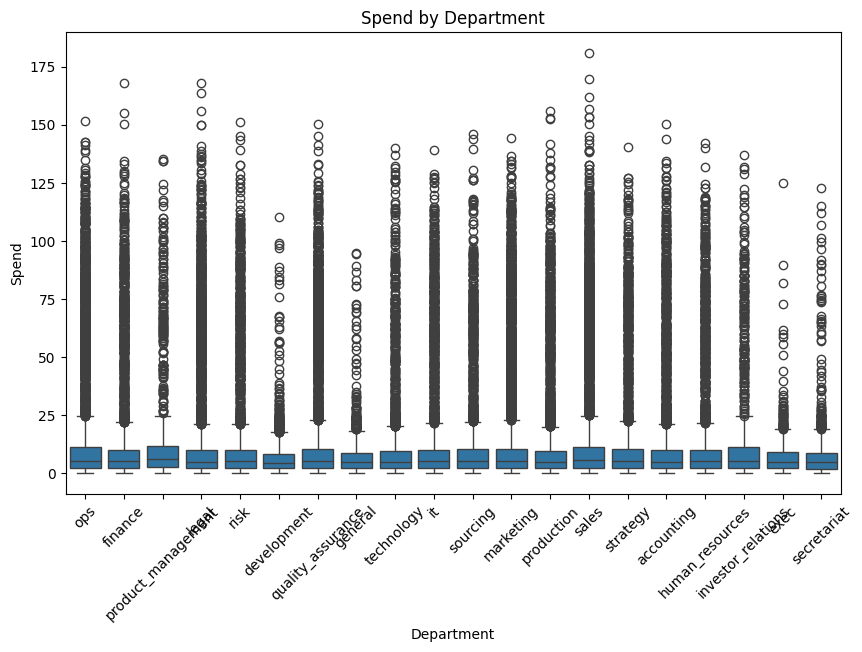

In [58]:
# Box plot of spending nature of every department is observed.

plt.figure(figsize=(10, 6))
sns.boxplot(x='department', y='spend', data=df)
plt.title('Spend by Department')
plt.xlabel('Department')
plt.ylabel('Spend')
plt.xticks(rotation=45)
plt.show()

In [59]:
# Aggregated spending nature is fetched here for every department present.

department_tot_spend = df.groupby('department')['spend'].sum().sort_values(ascending = False).reset_index()
department_tot_spend.head(27)

,department,spend
0,sales,105173.49
1,marketing,104553.40
2,ops,104014.25
3,legal,102084.43
4,quality_assurance,90664.06
5,production,82935.56
6,finance,65594.34
7,accounting,64915.39
8,human_resources,58514.87
9,risk,58064.80


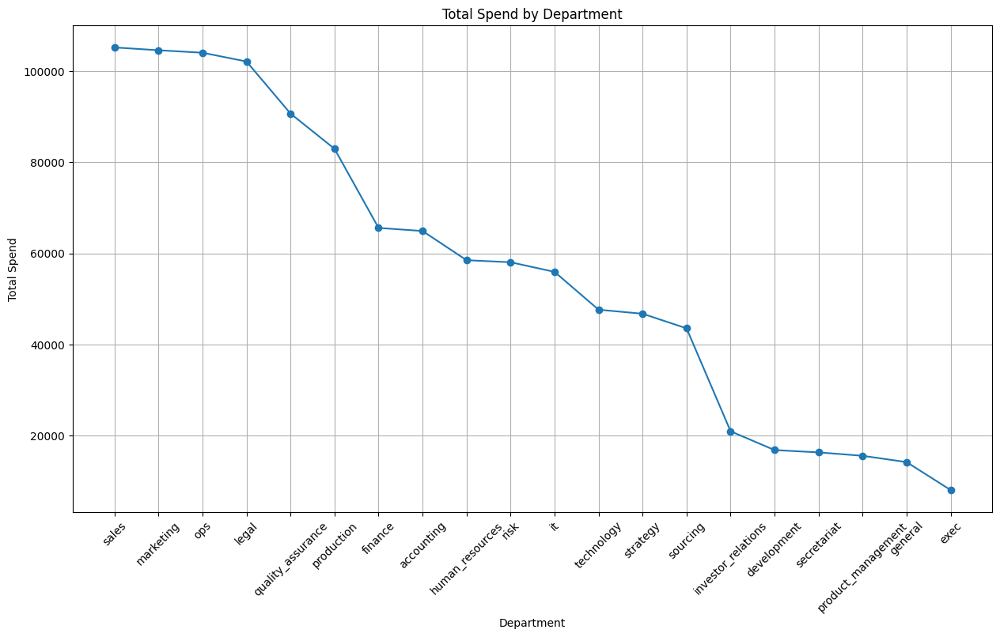

In [60]:
# Plotting the total spend for every department present.

plt.figure(figsize=(15, 8))
plt.plot(department_tot_spend['department'], department_tot_spend['spend'], marker='o', linestyle='-')
plt.title('Total Spend by Department')
plt.xlabel('Department')
plt.ylabel('Total Spend')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [61]:
# Average spending nature is fetched here for every department present.
department_avg_spend = df.groupby('department')['spend'].mean().sort_values(ascending = False).reset_index()
department_avg_spend.head(27)

,department,spend
0,product_management,14.448390
1,ops,13.646582
2,sales,13.447576
3,quality_assurance,12.172940
4,investor_relations,12.158854
5,marketing,11.752855
6,it,11.459048
7,strategy,10.805198
8,finance,10.690081
9,sourcing,10.671254


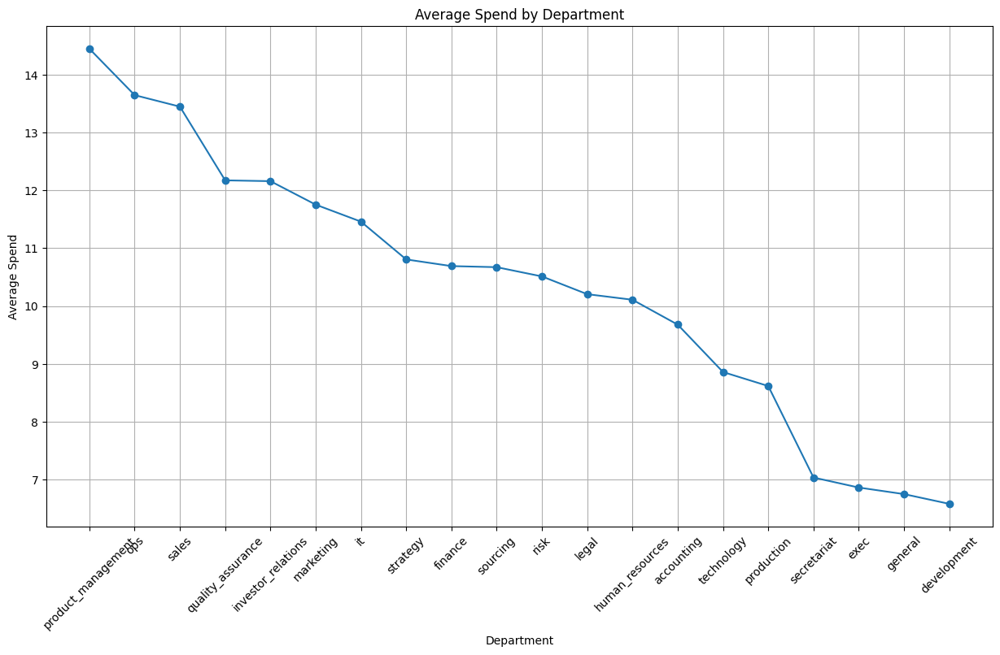

In [62]:
# Plotting the average spend for every department present.
plt.figure(figsize=(15, 8))
plt.plot(department_avg_spend['department'], department_avg_spend['spend'], marker='o', linestyle='-')
plt.title('Average Spend by Department')
plt.xlabel('Department')
plt.ylabel('Average Spend')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

## ***TIMELINE TREND***

### ***DAY WISE ANALYSIS***

In [63]:
# Printing out the unique days available in the datframe.
df.day_of_week.unique()

array(['Monday', 'Wednesday', 'Thursday', 'Friday', 'Sunday', 'Tuesday',
       'Saturday'], dtype=object)

In [64]:
# Printing out the unique days available alongside its total count (number of occuerences over the entire data).
day_counts = df['day_of_week'].value_counts()
day_counts

day_of_week
Monday       21567
Wednesday    21531
Tuesday      21502
Thursday     21335
Friday       14086
Saturday      3104
Sunday        2117
Name: count, dtype: int64

In [65]:
# Setting the day order explicitly for easier visualisation later in the bar plot.
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

<ipython-input-66-03fa9445a1ef>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=day_counts.index, y=day_counts.values, order=day_order, palette='viridis')


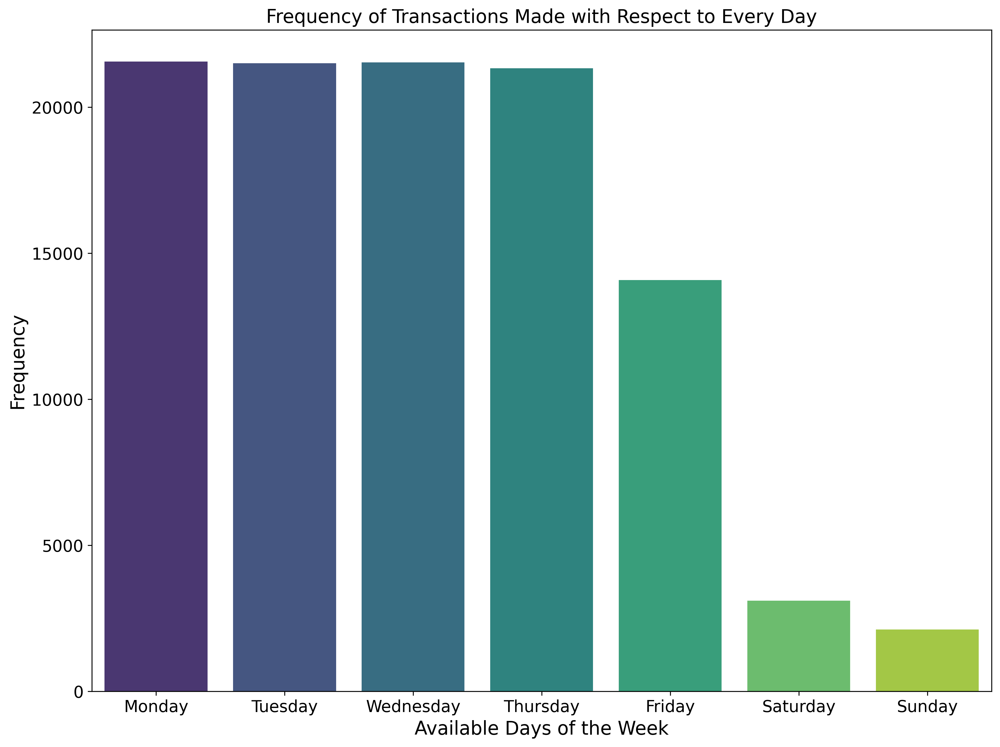

In [66]:
# Total transactions made aggregated over the available days throughout the entire time period.

plt.figure(figsize=(12, 9), dpi=300)
sns.barplot(x=day_counts.index, y=day_counts.values, order=day_order, palette='viridis')
plt.title('Frequency of Transactions Made with Respect to Every Day', fontsize=16)
plt.xlabel('Available Days of the Week', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

In [67]:
df[(df['day_of_week'] == 'Friday') & (df['at_risk_event'] == True)].shape

(183, 11)

In [68]:
day_counts

day_of_week
Monday       21567
Wednesday    21531
Tuesday      21502
Thursday     21335
Friday       14086
Saturday      3104
Sunday        2117
Name: count, dtype: int64

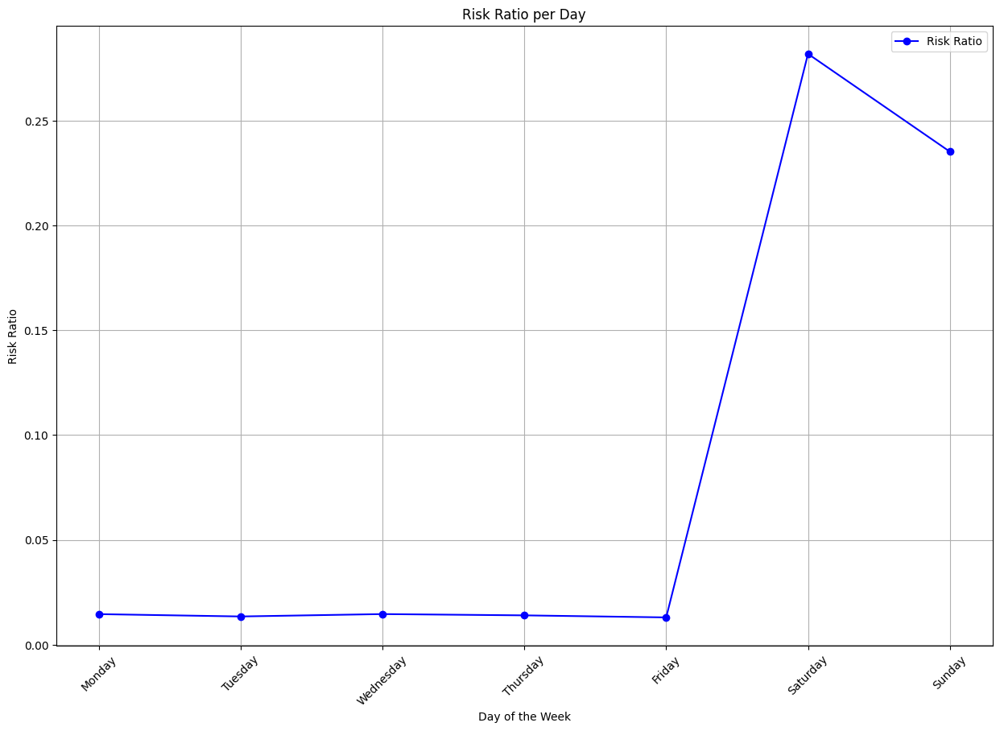

In [69]:

# This code calculates the risk ratio per day of the week and we therefore visualise through a plot for our convenience.
# It groups the data by the day of the week, calculates the total and at-risk events,
# computes the risk ratio, and then plots the risk ratio for each day of the week.

# Calculate total events and risk events per day of the week
day_counts = df.groupby('day_of_week')['at_risk_event'].count().reset_index(name='total_day_events')
risk_day_events = df.groupby('day_of_week')['at_risk_event'].sum().reset_index(name='total_risk_events')
day_counts = pd.merge(day_counts, risk_day_events, on='day_of_week')

# Calculate risk ratio
day_counts['risk_ratio'] = day_counts['total_risk_events'] / day_counts['total_day_events']


# Setting up the order for easy visualisation.
day_counts['day_of_week'] = pd.Categorical(day_counts['day_of_week'], categories=day_order, ordered=True)
day_counts = day_counts.sort_values('day_of_week')

# Plotting
plt.figure(figsize=(15,10))
plt.plot(day_counts['day_of_week'], day_counts['risk_ratio'], marker='o', linestyle='-', color='b', label='Risk Ratio')
plt.title('Risk Ratio per Day')
plt.xlabel('Day of the Week')
plt.ylabel('Risk Ratio')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.show()

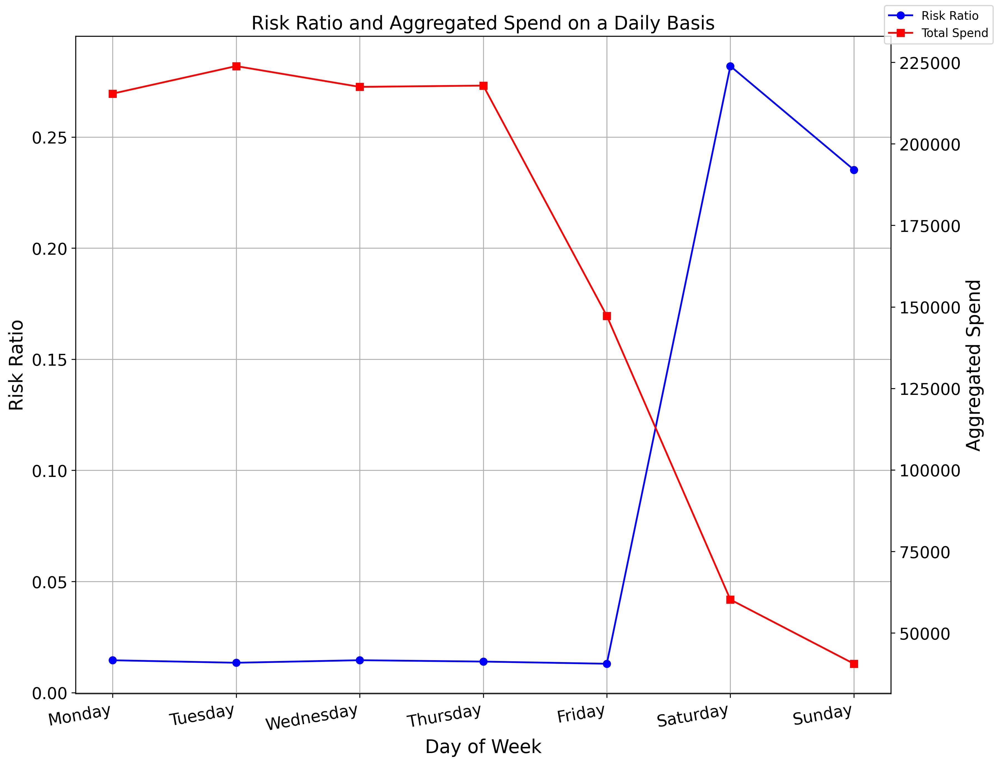

In [70]:
# Visualising the aggregated spend and risk ratio for every day present.


day_counts = df.groupby('day_of_week')['at_risk_event'].count().reset_index(name='total_day_events')
risk_day_events = df.groupby('day_of_week')['at_risk_event'].sum().reset_index(name='total_risk_events')
day_counts = pd.merge(day_counts, risk_day_events, on='day_of_week')

day_counts['risk_ratio'] = day_counts['total_risk_events'] / day_counts['total_day_events']

# Calculate total spend per department
day_total_spend = df.groupby('day_of_week')['spend'].sum().reset_index(name='total_spend')

day_counts = day_counts.set_index('day_of_week').loc[day_order].reset_index()
day_total_spend = day_total_spend.set_index('day_of_week').loc[day_order].reset_index()

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 9), dpi=300)

# Plotting risk ratio
ax1.plot(day_counts['day_of_week'], day_counts['risk_ratio'], marker='o', linestyle='-', color='b', label='Risk Ratio')
ax1.set_xlabel('Day of Week', fontsize=16)
ax1.set_ylabel('Risk Ratio', color='black', fontsize=16)
ax1.tick_params(axis='y', labelcolor='black', labelsize=14)
ax1.tick_params(axis='x', labelsize=14)
ax1.grid(True)

# Creating a second y-axis for total spend
ax2 = ax1.twinx()
ax2.plot(day_total_spend['day_of_week'], day_total_spend['total_spend'], marker='s', linestyle='-', color='r', label='Total Spend')
ax2.set_ylabel('Aggregated Spend', color='black', fontsize=16)
ax2.tick_params(axis='y', labelcolor='black', labelsize=14)

# Title and legend
plt.title('Risk Ratio and Aggregated Spend on a Daily Basis', fontsize=16)
fig.tight_layout()
fig.legend(loc='upper right')

# Rotate and adjust x-axis labels
plt.setp(ax1.get_xticklabels(), rotation=10, horizontalalignment='right')

plt.show()

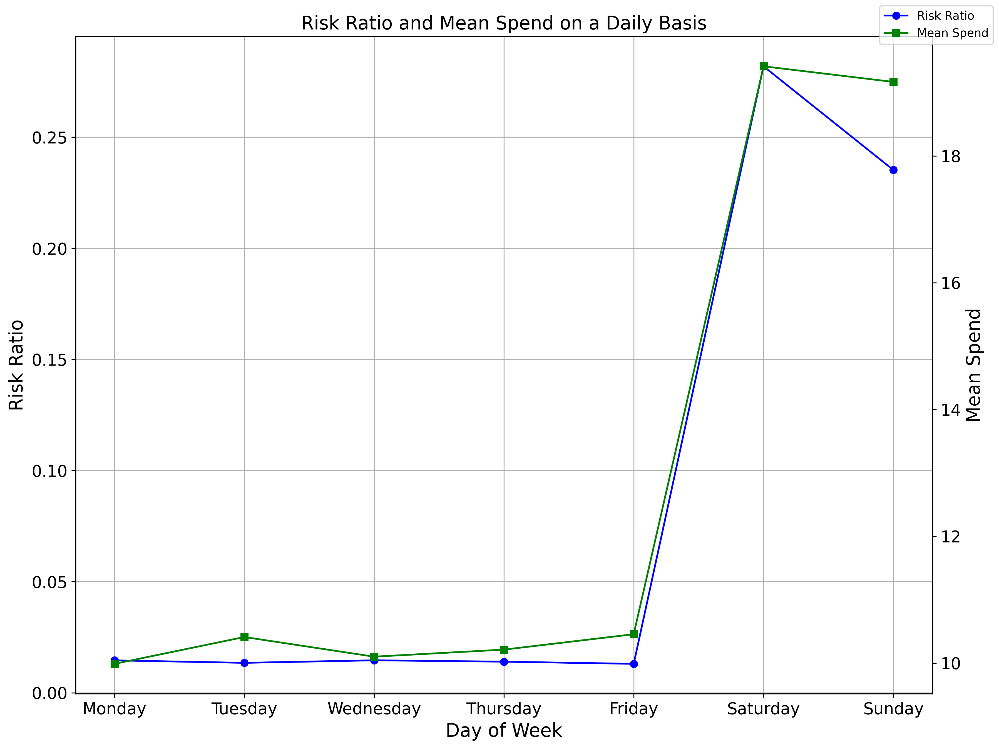

In [71]:

# Visualising the mean spend and risk ratio for every day present.

# Grouping and calculating required metrics
day_counts = df.groupby('day_of_week')['at_risk_event'].count().reset_index(name='total_day_events')
risk_day_events = df.groupby('day_of_week')['at_risk_event'].sum().reset_index(name='total_risk_events')
day_counts = pd.merge(day_counts, risk_day_events, on='day_of_week')

day_counts['risk_ratio'] = day_counts['total_risk_events'] / day_counts['total_day_events']

# Calculate mean spend per department
day_mean_spend = df.groupby('day_of_week')['spend'].mean().reset_index(name='mean_spend')

day_counts = day_counts.set_index('day_of_week').loc[day_order].reset_index()
day_mean_spend = day_mean_spend.set_index('day_of_week').loc[day_order].reset_index()

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 9), dpi=300)

# Plotting risk ratio
ax1.plot(day_counts['day_of_week'], day_counts['risk_ratio'], marker='o', linestyle='-', color='b', label='Risk Ratio')
ax1.set_xlabel('Day of Week', fontsize=16)
ax1.set_ylabel('Risk Ratio', color='black', fontsize=16)
ax1.tick_params(axis='y', labelcolor='black', labelsize=14)
ax1.tick_params(axis='x', labelsize=14)
ax1.grid(True)

# Creating a second y-axis for mean spend
ax2 = ax1.twinx()
ax2.plot(day_mean_spend['day_of_week'], day_mean_spend['mean_spend'], marker='s', linestyle='-', color='green', label='Mean Spend')
ax2.set_ylabel('Mean Spend', color='black', fontsize=16)
ax2.tick_params(axis='y', labelcolor='black', labelsize=14)

# Title and legend
plt.title('Risk Ratio and Mean Spend on a Daily Basis', fontsize=16)
fig.tight_layout()
fig.legend(loc='upper right')

# Rotate and adjust x-axis labels
plt.xticks(rotation=45, ha='right')  # Rotate labels and align them to the right

plt.show()


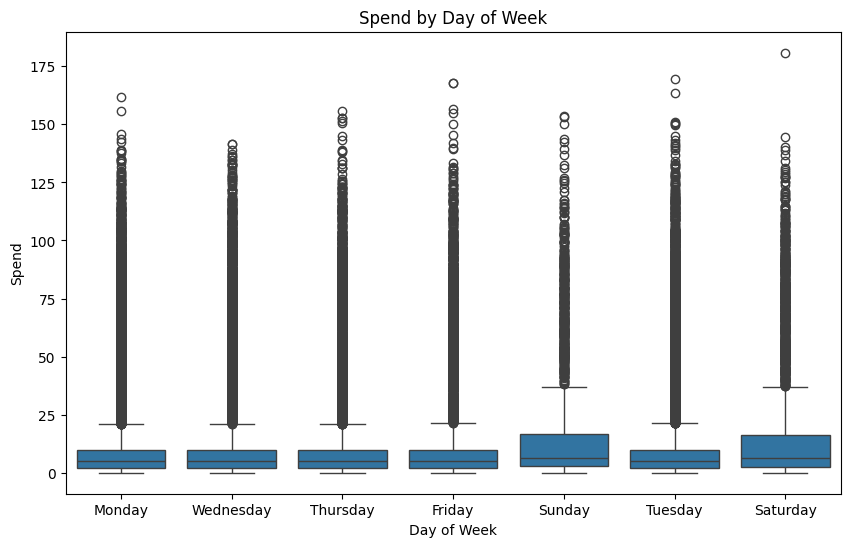

In [72]:
# Box plot visualisation for every day of the week present.

plt.figure(figsize=(10, 6))
sns.boxplot(x='day_of_week', y='spend', data=df)
plt.title('Spend by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Spend')
plt.show()

### ***MONTHLY ANALYSIS***

In [73]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend'],
      dtype='object')

In [74]:
# Fetching the appropriate month from the date column (which is already in datetime format).
df['month'] = df['date'].dt.month
df[['date','month']]

,date,month
0,2023-01-09,1
1,2023-01-11,1
2,2023-01-12,1
3,2023-01-12,1
4,2023-01-12,1
...,...,...
105237,2023-04-20,4
105238,2023-04-21,4
105239,2023-04-24,4
105240,2023-02-08,2


In [75]:
# Printing out the month and its value counts.
df.month.value_counts()

month
3    31159
2    27694
1    23520
4    22869
Name: count, dtype: int64

In [76]:
# Mapping every month with its appropriate name.

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

df['month_name'] = df['month'].map(month_names)

In [77]:
# Setting the order of the months.
month_order = ['January', 'February', 'March', 'April']

In [78]:
'''

Older one

month_counts = df['month_name'].value_counts()
month_counts

plt.figure(figsize=(10, 8))
sns.barplot(x=month_counts.index, y= month_counts.values,order = month_order, palette='viridis')
plt.title('Frequency of Transactions made with respect to every month present',fontsize = 12)
plt.xlabel('Available Months',fontsize = 12)
plt.ylabel('Frequency of transactions',fontsize = 12)
plt.show()

'''

"\n\nOlder one\n\nmonth_counts = df['month_name'].value_counts()\nmonth_counts\n\nplt.figure(figsize=(10, 8))\nsns.barplot(x=month_counts.index, y= month_counts.values,order = month_order, palette='viridis')\nplt.title('Frequency of Transactions made with respect to every month present',fontsize = 12)\nplt.xlabel('Available Months',fontsize = 12)\nplt.ylabel('Frequency of transactions',fontsize = 12)\nplt.show()\n\n"

<ipython-input-79-851821c5c01b>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=month_counts.index, y= month_counts.values,order = month_order, palette='viridis')


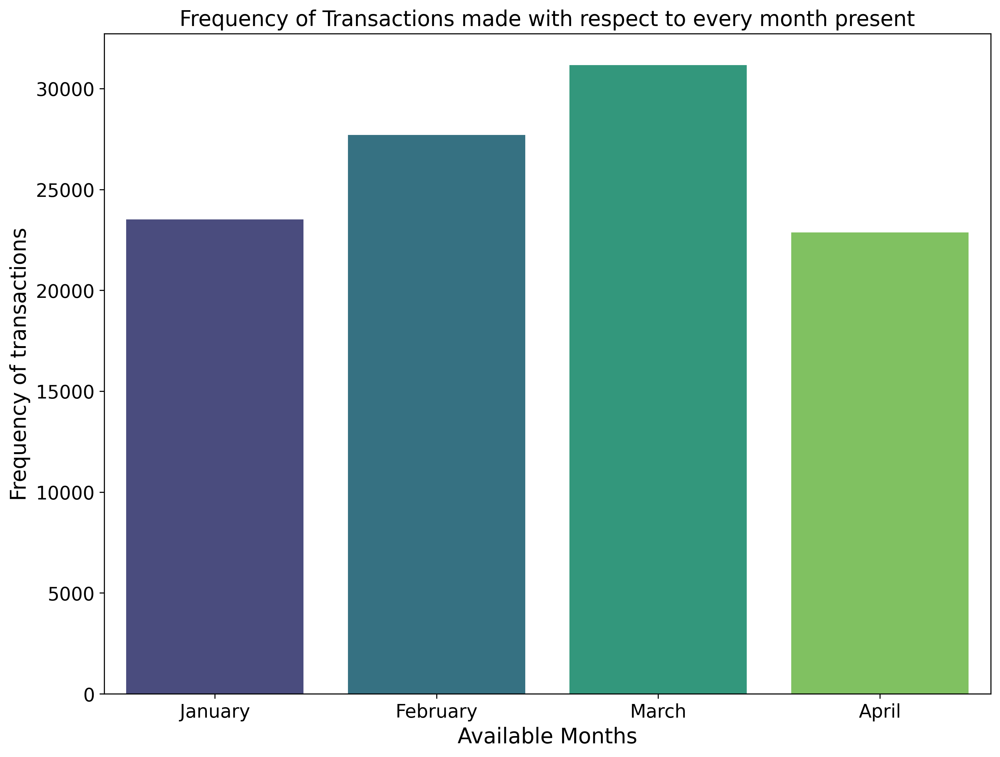

In [79]:
# Total number of transactions aggregated over every month across the entire time period present.

month_counts = df['month_name'].value_counts()
month_counts

plt.figure(figsize=(12,9), dpi = 300)
sns.barplot(x=month_counts.index, y= month_counts.values,order = month_order, palette='viridis')
plt.title('Frequency of Transactions made with respect to every month present',fontsize = 16)
plt.xlabel('Available Months',fontsize = 16)
plt.ylabel('Frequency of transactions',fontsize = 16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

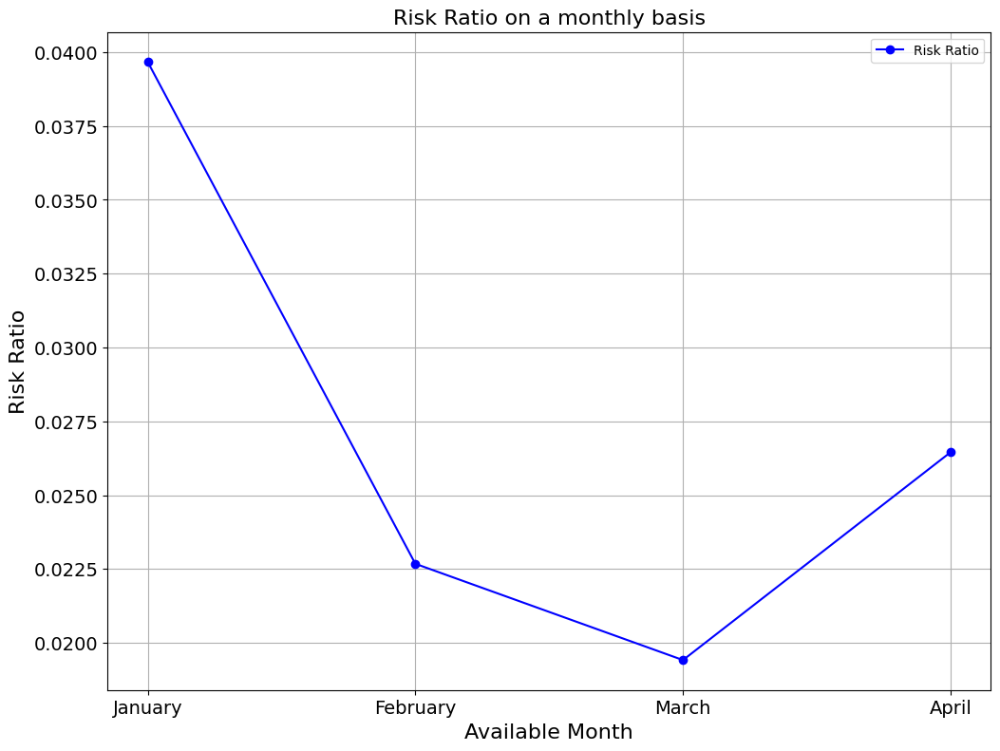

In [80]:
# Plotting the risk ratio for every month present.

month_counts = df.groupby('month_name')['at_risk_event'].count().reset_index(name='total_month_events')
risk_month_events = df.groupby('month_name')['at_risk_event'].sum().reset_index(name='total_risk_events')
month_counts = pd.merge(month_counts, risk_month_events, on='month_name')

month_counts['risk_ratio'] = month_counts['total_risk_events'] / month_counts['total_month_events']

month_counts = month_counts.set_index('month_name').loc[month_order].reset_index()

# Plotting
plt.figure(figsize=(12,9))
plt.plot(month_counts['month_name'], month_counts['risk_ratio'], marker='o', linestyle='-', color='blue', label='Risk Ratio')
plt.title('Risk Ratio on a monthly basis',fontsize = 16)
plt.xlabel('Available Month',fontsize = 16)
plt.ylabel('Risk Ratio',fontsize = 16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True)
plt.legend()
plt.show()

### ***HOURLY ANALYSIS***

In [81]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend', 'month', 'month_name'],
      dtype='object')

In [82]:
df.shape

(105242, 13)

In [83]:
df.hour_of_day.nunique()

105240

In [84]:
# Fetching the new column which has the hour in whole number format.

df['rounded_hour'] = df['hour_of_day'].round().astype('int')
df[['hour_of_day','rounded_hour']]

,hour_of_day,rounded_hour
0,11.994438,12
1,9.167461,9
2,8.863522,9
3,10.737514,11
4,13.516375,14
...,...,...
105237,12.349245,12
105238,10.207728,10
105239,17.414535,17
105240,12.837514,13


In [85]:
df.rounded_hour.min(), df.rounded_hour.max()

(0, 24)

In [86]:
df.rounded_hour.nunique()

25

In [87]:
hourly_transaction_counts = df['rounded_hour'].value_counts().sort_index()
hourly_transaction_counts

rounded_hour
0        16
1       125
2       481
3       761
4       492
5       224
6       376
7       944
8      2232
9      4469
10     7702
11    11647
12    14641
13    15966
14    14758
15    11646
16     7784
17     4504
18     2157
19     1054
20     1056
21     1262
22      739
23      186
24       20
Name: count, dtype: int64

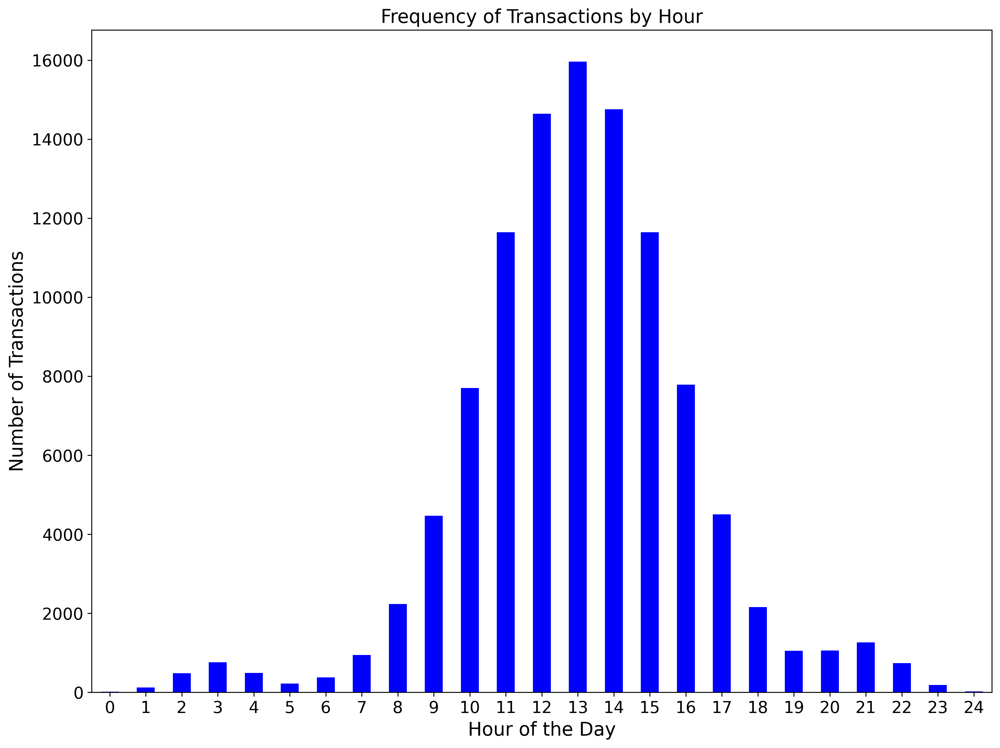

In [88]:
# Plotting the aggregated transactions over every hour of the day present.

plt.figure(figsize=(12, 9), dpi=300)
hourly_transaction_counts.plot(kind='bar', color='blue')
plt.title('Frequency of Transactions by Hour', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=16)
plt.ylabel('Number of Transactions', fontsize=16)
plt.xticks(rotation=0, fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()

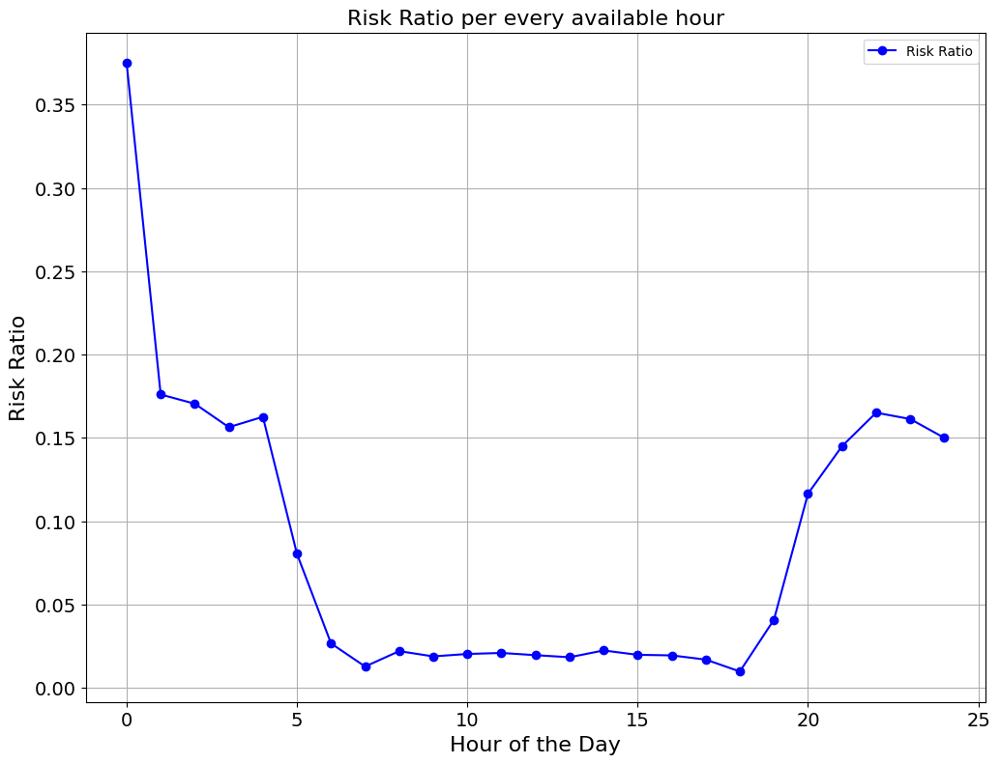

In [89]:
# Plotting the risk ratio present for every available hour present.

hour_counts = df.groupby('rounded_hour')['at_risk_event'].count().reset_index(name='total_hour_events')
risk_hour_events = df.groupby('rounded_hour')['at_risk_event'].sum().reset_index(name='total_risk_events')
hour_counts = pd.merge(hour_counts, risk_hour_events, on='rounded_hour')

hour_counts['risk_ratio'] = hour_counts['total_risk_events'] / hour_counts['total_hour_events']


# Plotting the graph.
plt.figure(figsize=(12,9))
plt.plot(hour_counts['rounded_hour'], hour_counts['risk_ratio'], marker='o', linestyle='-', color='blue', label='Risk Ratio')
plt.title('Risk Ratio per every available hour',fontsize = 16)
plt.xlabel('Hour of the Day',fontsize = 16)
plt.ylabel('Risk Ratio',fontsize = 16)
plt.xticks(rotation=0, fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True)
plt.legend()
plt.show()

In [90]:


                              ####   SOME INSIGHTS ON THE ABOVE DATETIME ANALYSIS ##########

# Number of transactions are lesser on the weekend as compared to the four available weekdays...

# isk events are observed to be more probable on the weekend (Fri + Sat + Sun) as compared to the number on the weekdays.

# The highest risk events are observed on Saturday followed by Sunday.

# Extreme outliers are observed on every day of the week present..

# Hours are rounded off , where it is now a 24 hour format (0,1,2,3.....24)

# Let us consider the working hours to be 8.00 AM - 6.00 PM ( 8.00 hrs - 18.00 hrs)...

# As per the above inference, we could say a lot of transactions happen between the working hours and hardly anything on both of the extremeties.

# Starts to gradually increase from the 8th hour, peaks at 13th hour and then a gradual decrease after it until the 18th hour...

# Risk events, as expected occur more on the out of office hours.... ( [1 - 4] and [20 - 23]).

# But on the contrary, we are expecting a rise of risk events in ther working hours as well , from the 8th hour to the 17th hour... (interesting!).





In [91]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend', 'month', 'month_name',
       'rounded_hour'],
      dtype='object')

## ***CORRELATION AND COVARIANCE CALCULATION***

In [92]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

In [93]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend', 'month', 'month_name',
       'rounded_hour'],
      dtype='object')

In [94]:
corr_df = df[['day_of_week','hour_of_day','department','spend','month','at_risk_event']]
corr_df

corr_df['department'] = label_encoder.fit_transform(corr_df['department'])
corr_df['day_of_week'] = label_encoder.fit_transform(corr_df['day_of_week'])


<ipython-input-94-78ff9f9b37de>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_df['department'] = label_encoder.fit_transform(corr_df['department'])
<ipython-input-94-78ff9f9b37de>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_df['day_of_week'] = label_encoder.fit_transform(corr_df['day_of_week'])


In [95]:
corr_df.cov() # Describing the covariance measures across every numerical column present.

,day_of_week,hour_of_day,department,spend,month,at_risk_event
day_of_week,4.767455,0.022018,-0.083238,-0.439158,0.033043,-0.012340
hour_of_day,0.022018,9.683672,0.028575,0.819555,0.000101,0.002823
department,-0.083238,0.028575,28.345071,1.990078,0.019110,0.004088
spend,-0.439158,0.819555,1.990078,339.930080,0.640005,0.392311
month,0.033043,0.000101,0.019110,0.640005,1.131527,-0.004973
at_risk_event,-0.012340,0.002823,0.004088,0.392311,-0.004973,0.025637


In [96]:
corr_df.corr() # Describing the correlation scores among the features present.

,day_of_week,hour_of_day,department,spend,month,at_risk_event
day_of_week,1.000000,0.003241,-0.007160,-0.010909,0.014227,-0.035297
hour_of_day,0.003241,1.000000,0.001725,0.014284,0.000031,0.005665
department,-0.007160,0.001725,1.000000,0.020274,0.003374,0.004796
spend,-0.010909,0.014284,0.020274,1.000000,0.032633,0.132894
month,0.014227,0.000031,0.003374,0.032633,1.000000,-0.029200
at_risk_event,-0.035297,0.005665,0.004796,0.132894,-0.029200,1.000000


In [97]:
corr_df.corr()['at_risk_event'] # Seeing the correlation scores with respect to the target feature (at_risk_event).

day_of_week     -0.035297
hour_of_day      0.005665
department       0.004796
spend            0.132894
month           -0.029200
at_risk_event    1.000000
Name: at_risk_event, dtype: float64

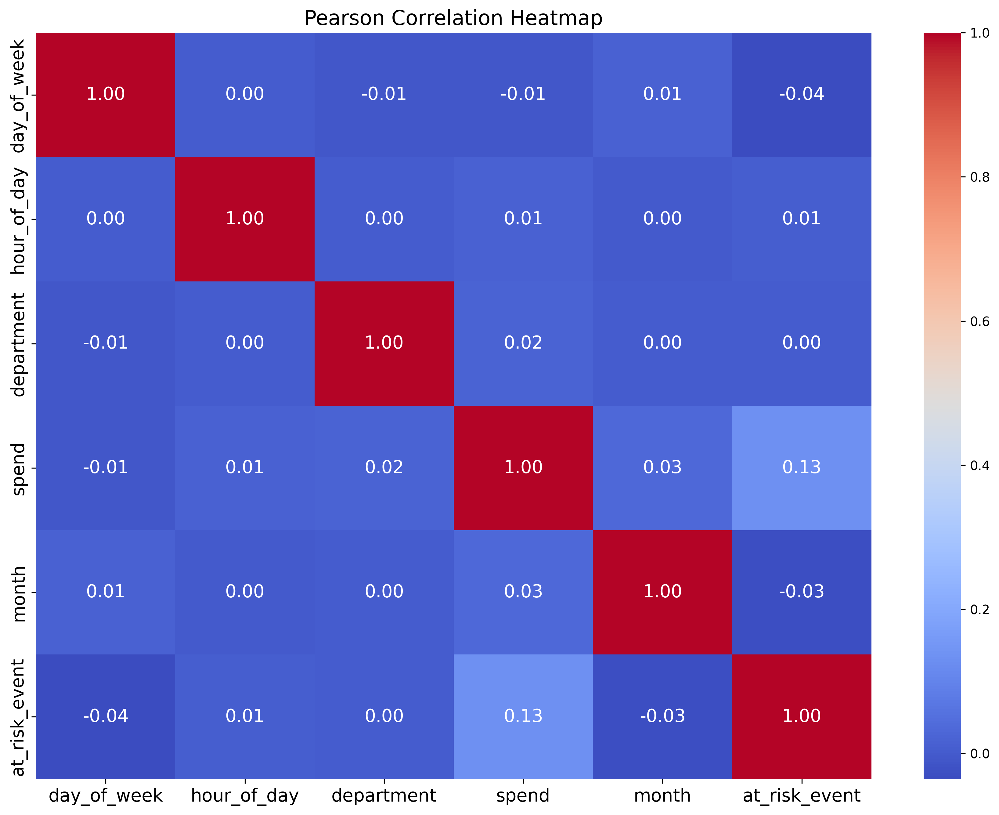

In [98]:
# Plotting the Pearson Correlation Heatmap.

plt.figure(figsize=(12, 9), dpi=300)
correlation_matrix = corr_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 14})
plt.title('Pearson Correlation Heatmap', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()  # Adjust layout to prevent clipping

plt.show()

# ***FEATURE ENGINEERING***

In [99]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend', 'month', 'month_name',
       'rounded_hour'],
      dtype='object')

In [100]:
df.shape

(105242, 14)

## ***AGGREGATE LEVEL FEATURES***

In [101]:
## Aggregate features are found out below on spend amount grouped by 'individuals' present..

## for instance, mean_amount of individual_id == 1 would take up a single value on every record which captures the overall mean of that individual...

## likewise the calculation on other statistical measure is done and specified here...


In [102]:
# Performs various aggregations on the 'spend' column grouped by 'individual_id' and merges the results back to the original dataframe.
# The aggregations encompass mean, median, sum, standard deviation, minimum, and maximum of the 'spend' column.

# Aggregations are performed
aggregations = df.groupby('individual_id')['spend'].agg(['mean', 'median', 'sum', 'std', 'min', 'max']).reset_index()

#Renaming the columns for a better understanding.
aggregations.columns = ['individual_id', 'mean_amount', 'median_amount', 'total_amount', 'std_amount', 'min_amount', 'max_amount']

# Merging onto the main dataframe.
df = df.merge(aggregations, on='individual_id', how='left')


In [103]:
# This code performs daily aggregations on the 'spend' column grouped by 'individual_id' and 'date',
# and then merges the results back to the original dataframe.
# The aggregations include mean, sum, and standard deviation of the 'spend' column for each day.

daily_aggregations = df.groupby(['individual_id', 'date'])['spend'].agg(['mean', 'sum', 'std']).reset_index()
daily_aggregations.columns = ['individual_id', 'date', 'daily_mean_amount', 'daily_total_amount', 'daily_std_amount']
df = df.merge(daily_aggregations, on=['individual_id', 'date'], how='left')

In [104]:
df[df['individual_id'] == 1][['date','spend','daily_total_amount','daily_mean_amount']].head(20)

,date,spend,daily_total_amount,daily_mean_amount
0,2023-01-09,2.10,2.10,2.100000
1,2023-01-11,4.45,4.45,4.450000
2,2023-01-12,3.94,8.16,2.720000
3,2023-01-12,2.72,8.16,2.720000
4,2023-01-12,1.50,8.16,2.720000
5,2023-01-13,3.02,3.02,3.020000
6,2023-01-15,8.14,8.14,8.140000
7,2023-01-16,2.39,2.39,2.390000
8,2023-01-17,9.22,9.22,9.220000
9,2023-01-18,8.22,11.12,5.560000


## ***ROLLING WINDOW FEATURES***

In [105]:
# Calculate rolling features over a 7-day window

df['rolling_mean_amount_7d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=7, min_periods=1).mean())
df['rolling_std_amount_7d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=7, min_periods=1).std())
df['rolling_sum_amount_7d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=7, min_periods=1).sum())
df['rolling_transaction_count_7d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=7, min_periods=1).count())

In [106]:
# Calculate rolling features over a 5-day window

df['rolling_mean_amount_5d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=5, min_periods=1).mean())
df['rolling_std_amount_5d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=5, min_periods=1).std())
df['rolling_sum_amount_5d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=5, min_periods=1).sum())
df['rolling_transaction_count_5d'] = df.groupby('individual_id')['spend'].transform(lambda x: x.rolling(window=5, min_periods=1).count())

## ***OTHER FEATURES***

In [107]:
df[['date']]

,date
0,2023-01-09
1,2023-01-11
2,2023-01-12
3,2023-01-12
4,2023-01-12
...,...
105237,2023-04-20
105238,2023-04-21
105239,2023-04-24
105240,2023-02-08


In [108]:
df[['date','individual_id']]

,date,individual_id
0,2023-01-09,1
1,2023-01-11,1
2,2023-01-12,1
3,2023-01-12,1
4,2023-01-12,1
...,...,...
105237,2023-04-20,2184
105238,2023-04-21,2184
105239,2023-04-24,2184
105240,2023-02-08,2185


In [109]:
# Time since last transaction feature is derived -- where it captures the time difference between two transcations over a particual individual.

df = df.sort_values(by=['individual_id', 'date'])
df['time_since_last_transaction'] = df.groupby('individual_id')['date'].diff().dt.total_seconds().fillna(0) / 3600

In [110]:
df[['date','individual_id','time_since_last_transaction']]

,date,individual_id,time_since_last_transaction
0,2023-01-09,1,0.0
1,2023-01-11,1,48.0
2,2023-01-12,1,24.0
3,2023-01-12,1,0.0
4,2023-01-12,1,0.0
...,...,...,...
105237,2023-04-20,2184,24.0
105238,2023-04-21,2184,24.0
105239,2023-04-24,2184,72.0
105240,2023-02-08,2185,0.0


In [111]:
#  The ratio is calculated to understand on how much the individual spend amount is deviating from the average spend.

df['amount_to_mean_ratio'] = df['spend'] / df['mean_amount']

In [112]:
# Calculate cumulative sum of spend
df['cumulative_sum_amount'] = df.groupby('individual_id')['spend'].cumsum()

In [113]:
df['lag_amount_1'] = df.groupby('individual_id')['spend'].shift(1) # Calculate lagged amount (1 day lag)

In [114]:
# Label encoding the department feature column.

label_encoder = LabelEncoder()

df['department_encoded'] = label_encoder.fit_transform(df['department'])

In [115]:
df.day_of_week.value_counts()

day_of_week
Monday       21567
Wednesday    21531
Tuesday      21502
Thursday     21335
Friday       14086
Saturday      3104
Sunday        2117
Name: count, dtype: int64

In [116]:
day_mapping = {'Monday' : 1, 'Tuesday' : 2, 'Wednesday' : 3, 'Thursday' : 4, 'Friday' : 5, 'Saturday': 6, 'Sunday' : 7}

df['day_of_week_enc'] = df['day_of_week'].map(day_mapping)

df.day_of_week_enc.value_counts()

day_of_week_enc
1    21567
3    21531
2    21502
4    21335
5    14086
6     3104
7     2117
Name: count, dtype: int64

In [117]:
# Deriving the feature to understand on whether the transaction happens over the weekday or weekend.

df['is_weekend'] = df['day_of_week_enc'].isin([5,6]).astype(int)
df.is_weekend.value_counts()

is_weekend
0    88052
1    17190
Name: count, dtype: int64

In [118]:
# Capturing the total spend and mean spend (department wise).

df['spend_per_dept'] = df.groupby('department')['spend'].transform('sum')
df['avg_spend_per_dept'] = df.groupby('department')['spend'].transform('mean')

In [119]:
# Capturing the total spend and mean spend (based on day of week).

df['spend_per_day'] = df.groupby('day_of_week_enc')['spend'].transform('sum')
df['avg_spend_per_day'] = df.groupby('day_of_week_enc')['spend'].transform('mean')

In [120]:
# Capturing the total spend and mean spend (based on every hour of the day present).

df['spend_per_hour'] = df.groupby('rounded_hour')['spend'].transform('sum')
df['avg_spend_per_hour'] = df.groupby('rounded_hour')['spend'].transform('mean')

In [121]:
df[['spend_per_day','avg_spend_per_day','avg_spend_per_hour']]

,spend_per_day,avg_spend_per_day,avg_spend_per_hour
0,215397.97,9.987387,9.806250
1,217473.44,10.100480,9.399098
2,217868.14,10.211771,9.399098
3,217868.14,10.211771,9.986671
4,217868.14,10.211771,9.935018
...,...,...,...
105237,217868.14,10.211771,9.806250
105238,147263.90,10.454629,9.911218
105239,215397.97,9.987387,9.927043
105240,217473.44,10.100480,9.712075


In [122]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend', 'month', 'month_name',
       'rounded_hour', 'mean_amount', 'median_amount', 'total_amount',
       'std_amount', 'min_amount', 'max_amount', 'daily_mean_amount',
       'daily_total_amount', 'daily_std_amount', 'rolling_mean_amount_7d',
       'rolling_std_amount_7d', 'rolling_sum_amount_7d',
       'rolling_transaction_count_7d', 'rolling_mean_amount_5d',
       'rolling_std_amount_5d', 'rolling_sum_amount_5d',
       'rolling_transaction_count_5d', 'time_since_last_transaction',
       'amount_to_mean_ratio', 'cumulative_sum_amount', 'lag_amount_1',
       'department_encoded', 'day_of_week_enc', 'is_weekend', 'spend_per_dept',
       'avg_spend_per_dept', 'spend_per_day', 'avg_spend_per_day',
       'spend_per_hour', 'avg_spend_per_hour'],
      dtype='object')

In [123]:
df.shape

(105242, 44)

In [124]:
df_corr_new = df[['spend', 'at_risk_event',
       'at_risk_behaviour_window', 'rounded_hour',
       'mean_amount', 'median_amount', 'total_amount', 'std_amount',
       'min_amount', 'max_amount', 'daily_mean_amount', 'daily_total_amount',
       'daily_std_amount', 'rolling_mean_amount_7d', 'rolling_std_amount_7d',
       'rolling_sum_amount_7d', 'rolling_transaction_count_7d',
       'rolling_mean_amount_5d', 'rolling_std_amount_5d',
       'rolling_sum_amount_5d', 'rolling_transaction_count_5d',
       'amount_to_mean_ratio','cumulative_sum_amount', 'lag_amount_1', 'day_of_week_enc',
       'is_weekend','spend_per_dept','department_encoded',
       'avg_spend_per_dept', 'spend_per_day', 'avg_spend_per_day']]

In [125]:
df_corr_new.corr()['at_risk_event']

spend                           0.132894
at_risk_event                   1.000000
at_risk_behaviour_window        0.024117
rounded_hour                    0.005918
mean_amount                     0.010898
median_amount                   0.006479
total_amount                   -0.014661
std_amount                      0.022917
min_amount                      0.047026
max_amount                      0.017586
daily_mean_amount               0.107761
daily_total_amount              0.043473
daily_std_amount                0.158044
rolling_mean_amount_7d          0.016573
rolling_std_amount_7d           0.074844
rolling_sum_amount_7d           0.000199
rolling_transaction_count_7d   -0.035640
rolling_mean_amount_5d          0.026062
rolling_std_amount_5d           0.089417
rolling_sum_amount_5d           0.014115
rolling_transaction_count_5d   -0.026605
amount_to_mean_ratio            0.265433
cumulative_sum_amount          -0.034743
lag_amount_1                   -0.013317
day_of_week_enc 

# ***TRAIN TEST SPLIT***

In [126]:
np.random.seed(42)
unique_individuals = df['individual_id'].unique()

# Randomly select 1748 individuals --- since we calculated and got to know that setting here would get us
# 80% in the train data and 20% in the test data.

selected_individuals = np.random.choice(unique_individuals, size=1742, replace=False)

# Create train and test DataFrames
train_df = df[df['individual_id'].isin(selected_individuals)]
test_df = df[~df['individual_id'].isin(selected_individuals)]

In [127]:
train_df.shape , test_df.shape # Printing out the shapes of train and test dataset.

((84719, 44), (20523, 44))

In [128]:
len(unique_individuals) - len(selected_individuals)

443

In [129]:
selected_individuals

array([ 283,  368, 1065, ...,  656,  936,  823])

In [130]:
train_df.shape , test_df.shape

((84719, 44), (20523, 44))

In [131]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend', 'month', 'month_name',
       'rounded_hour', 'mean_amount', 'median_amount', 'total_amount',
       'std_amount', 'min_amount', 'max_amount', 'daily_mean_amount',
       'daily_total_amount', 'daily_std_amount', 'rolling_mean_amount_7d',
       'rolling_std_amount_7d', 'rolling_sum_amount_7d',
       'rolling_transaction_count_7d', 'rolling_mean_amount_5d',
       'rolling_std_amount_5d', 'rolling_sum_amount_5d',
       'rolling_transaction_count_5d', 'time_since_last_transaction',
       'amount_to_mean_ratio', 'cumulative_sum_amount', 'lag_amount_1',
       'department_encoded', 'day_of_week_enc', 'is_weekend', 'spend_per_dept',
       'avg_spend_per_dept', 'spend_per_day', 'avg_spend_per_day',
       'spend_per_hour', 'avg_spend_per_hour'],
      dtype='object')

In [132]:
# Manaul selection of desired features which could be useful for modeling purpose.
# Some evident features like individual_id and timestamp are ignore....

features = ['hour_of_day', 'spend', 'rounded_hour',
       'mean_amount', 'median_amount', 'total_amount', 'std_amount',
       'min_amount', 'max_amount', 'daily_mean_amount', 'daily_total_amount',
       'daily_std_amount', 'rolling_mean_amount_7d', 'rolling_std_amount_7d',
       'rolling_sum_amount_7d', 'rolling_transaction_count_7d',
       'rolling_mean_amount_5d', 'rolling_std_amount_5d',
       'rolling_sum_amount_5d', 'rolling_transaction_count_5d',
       'time_since_last_transaction', 'amount_to_mean_ratio',
       'cumulative_sum_amount', 'lag_amount_1', 'department_encoded',
       'day_of_week_enc', 'is_weekend', 'spend_per_dept', 'avg_spend_per_dept',
       'spend_per_day', 'avg_spend_per_day']

In [133]:
# Another potential set of useful features are fetched based on domain knowledge.

updated_features = ['spend','rounded_hour','mean_amount', 'median_amount', 'total_amount',
       'min_amount', 'max_amount', 'daily_mean_amount', 'daily_total_amount',
        'rolling_mean_amount_7d',
       'rolling_sum_amount_7d', 'rolling_transaction_count_7d',
       'rolling_mean_amount_5d',
       'rolling_sum_amount_5d', 'rolling_transaction_count_5d', 'amount_to_mean_ratio',
       'cumulative_sum_amount', 'day_of_week_enc',
       'is_weekend','spend_per_dept','department_encoded',
       'avg_spend_per_dept', 'spend_per_day', 'avg_spend_per_day']


base_features = ['hour_of_day','spend','at_risk_event','rounded_hour','day_of_week_enc', 'is_weekend', 'rolling_mean_spending',
       'rolling_mean_spend', 'total_spend', 'avg_spend', 'max_spend',
       'min_spend', 'dev_spend', 'spend_per_dept', 'avg_spend_per_dept',
       'spend_per_day', 'avg_spend_per_day']



In [134]:
# Some derived features like 'daily_std_amount' has NA values , which are imputed with zero for easy modeling.

train_df[features] = train_df[features].fillna(0)
test_df[features] = test_df[features].fillna(0)

<ipython-input-134-56723d8ac8a6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df[features] = train_df[features].fillna(0)
<ipython-input-134-56723d8ac8a6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df[features] = test_df[features].fillna(0)


In [135]:
train_df[features].isna().sum()

hour_of_day                     0
spend                           0
rounded_hour                    0
mean_amount                     0
median_amount                   0
total_amount                    0
std_amount                      0
min_amount                      0
max_amount                      0
daily_mean_amount               0
daily_total_amount              0
daily_std_amount                0
rolling_mean_amount_7d          0
rolling_std_amount_7d           0
rolling_sum_amount_7d           0
rolling_transaction_count_7d    0
rolling_mean_amount_5d          0
rolling_std_amount_5d           0
rolling_sum_amount_5d           0
rolling_transaction_count_5d    0
time_since_last_transaction     0
amount_to_mean_ratio            0
cumulative_sum_amount           0
lag_amount_1                    0
department_encoded              0
day_of_week_enc                 0
is_weekend                      0
spend_per_dept                  0
avg_spend_per_dept              0
spend_per_day 

# ***FEATURE SELECTION***

In [136]:

# Scaling on the train and test dataframe is done which has our desired features through manual feature selection (the list derived in the above section).
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_df[features])
X_test_scaled = scaler.fit_transform(test_df[features])

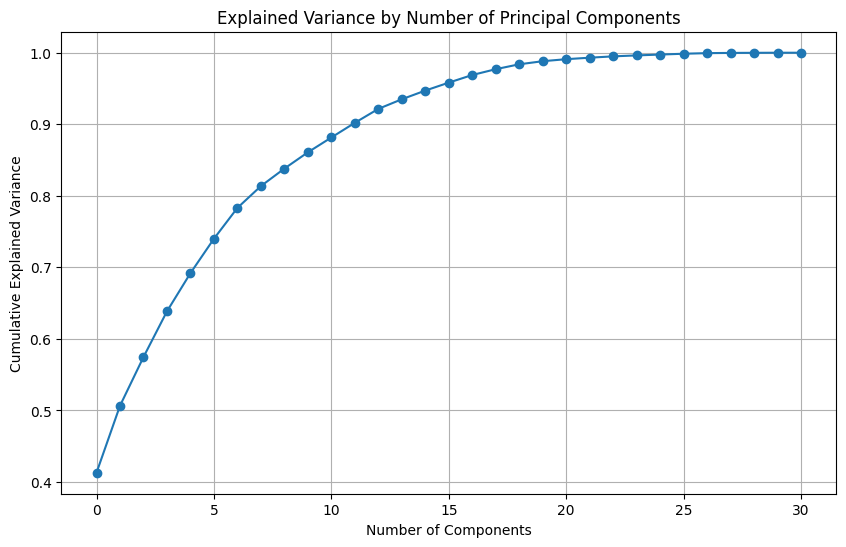

In [137]:
# Apply PCA without specifying n_components to examine explained variance
pca = PCA()
pca.fit(X_train_scaled)

# Calculate cumulative explained variance accordingly.
cumulative_explained_variance = pca.explained_variance_ratio_.cumsum()

# Plot cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Principal Components')
plt.grid(True)
plt.show()

# Determine the number of components that explain a desired amount of variance (e.g., 95%)
optimal_n_components = np.argmax(cumulative_explained_variance >= 0.95) + 1


In [138]:
print(f"Optimal number of components to retain 95% variance: {optimal_n_components}")

Optimal number of components to retain 95% variance: 16


In [139]:
pca = PCA(n_components = 16)  # Specify the number of components you want
pca.fit(X_train_scaled)

PCA(n_components=16)

In [140]:
# Get the loadings (coefficients of the original features on the principal components)
loadings = pca.components_.T

# Create a DataFrame for the loadings for better readability
loadings_df = pd.DataFrame(loadings, index=features, columns=[f'PC{i+1}' for i in range(pca.n_components_)])

# Calculate the importance of each feature by summing the absolute values of the loadings across all principal components
feature_importance = loadings_df.abs().sum(axis=1)

# Sort the features by importance
sorted_features = feature_importance.sort_values(ascending=False)

In [141]:
# Changing the number 'N' below explicitly each time fetched us the table in the report
# which has all the results of all the models respectively..

# Each time the appropriate 'N' is set here, and then all the three models are ran after whhich the scores are noted..
# This is repeated for N = 15,20,25 and 31 (refer the table for the scores)..

In [142]:
# Select the top N features where 'N' is set as per our convenience.
top_n_features = sorted_features.head(15)  # Replace the number inside the head accordingly to select that number of features.

print("Top features based on PCA loadings:")
print(top_n_features)

Top features based on PCA loadings:
min_amount                      2.952357
time_since_last_transaction     2.724758
is_weekend                      2.410161
cumulative_sum_amount           2.366397
spend_per_dept                  2.321290
daily_std_amount                2.203804
avg_spend_per_dept              2.153714
max_amount                      2.112520
avg_spend_per_day               2.091070
lag_amount_1                    2.014724
day_of_week_enc                 1.970987
department_encoded              1.913373
amount_to_mean_ratio            1.891511
rolling_transaction_count_7d    1.710748
rolling_transaction_count_5d    1.684891
dtype: float64


In [143]:
pca_features = top_n_features.index.tolist()

In [144]:
len(pca_features) # Final list of features which we have acquired through the manual 'N' which we have explicitly set.

15

In [145]:
train_df[pca_features]

,min_amount,time_since_last_transaction,is_weekend,cumulative_sum_amount,spend_per_dept,daily_std_amount,avg_spend_per_dept,max_amount,avg_spend_per_day,lag_amount_1,day_of_week_enc,department_encoded,amount_to_mean_ratio,rolling_transaction_count_7d,rolling_transaction_count_5d
0,0.10,0.0,0,2.10,104014.25,0.00,13.646582,110.06,9.987387,0.00,1,10,0.304535,1.0,1.0
1,0.10,48.0,0,6.55,104014.25,0.00,13.646582,110.06,10.100480,2.10,3,10,0.645323,2.0,2.0
2,0.10,24.0,0,10.49,104014.25,1.22,13.646582,110.06,10.211771,4.45,4,10,0.571365,3.0,3.0
3,0.10,0.0,0,13.21,104014.25,1.22,13.646582,110.06,10.211771,3.94,4,10,0.394445,4.0,4.0
4,0.10,0.0,0,14.71,104014.25,1.22,13.646582,110.06,10.211771,2.72,4,10,0.217525,5.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105237,0.15,24.0,0,523.93,65594.34,0.00,10.690081,29.06,10.211771,2.03,4,3,1.281047,7.0,5.0
105238,0.15,24.0,1,544.17,65594.34,0.00,10.690081,29.06,10.454629,8.91,5,3,2.910032,7.0,5.0
105239,0.15,72.0,0,556.42,65594.34,0.00,10.690081,29.06,9.987387,20.24,1,3,1.761259,7.0,5.0
105240,1.43,0.0,0,15.68,20998.34,0.00,12.158854,15.68,10.100480,0.00,3,6,1.832846,1.0,1.0


# ***MODELLING***

## ***CONVENTIONAL APPROACH***

### ***ISOLATION FOREST MODEL***

In [146]:
df.individual_id.nunique()

2185

In [147]:
df.columns

Index(['Unnamed: 0', 'individual_id', 'timestamp', 'date', 'day_of_week',
       'hour_of_day', 'department', 'spend', 'at_risk_event',
       'at_risk_behaviour_window', 'scaled_spend', 'month', 'month_name',
       'rounded_hour', 'mean_amount', 'median_amount', 'total_amount',
       'std_amount', 'min_amount', 'max_amount', 'daily_mean_amount',
       'daily_total_amount', 'daily_std_amount', 'rolling_mean_amount_7d',
       'rolling_std_amount_7d', 'rolling_sum_amount_7d',
       'rolling_transaction_count_7d', 'rolling_mean_amount_5d',
       'rolling_std_amount_5d', 'rolling_sum_amount_5d',
       'rolling_transaction_count_5d', 'time_since_last_transaction',
       'amount_to_mean_ratio', 'cumulative_sum_amount', 'lag_amount_1',
       'department_encoded', 'day_of_week_enc', 'is_weekend', 'spend_per_dept',
       'avg_spend_per_dept', 'spend_per_day', 'avg_spend_per_day',
       'spend_per_hour', 'avg_spend_per_hour'],
      dtype='object')

In [148]:
df.individual_id.nunique()

2185

In [149]:
train_df.individual_id.nunique() , test_df.individual_id.nunique()

(1742, 443)

In [150]:
train_df.shape , test_df.shape

((84719, 44), (20523, 44))

In [151]:
train_df.at_risk_event.value_counts() # Figuring out the number of risk events on the train dataset.

at_risk_event
False    82519
True      2200
Name: count, dtype: int64

In [152]:
test_df.at_risk_event.value_counts()  # Figuring out the number of risk events on the test datase.

at_risk_event
False    19952
True       571
Name: count, dtype: int64

In [153]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_df[pca_features])
X_test_scaled = scaler.fit_transform(test_df[pca_features])

In [154]:
X_test_scaled

array([[-0.14222078, -0.70625169, -0.43606547, ..., -0.71860722,
        -4.20169452, -4.88980486],
       [-0.14222078,  1.26546301, -0.43606547, ..., -0.31263859,
        -3.44517276, -3.59812148],
       [-0.14222078,  1.59408213, -0.43606547, ..., -0.36733752,
        -2.68865099, -2.3064381 ],
       ...,
       [ 0.11792639,  0.9368439 , -0.43606547, ..., -0.84040699,
         0.33743606,  0.27692866],
       [ 0.11792639,  0.27960566,  2.29323361, ...,  1.05967664,
         0.33743606,  0.27692866],
       [ 0.11792639,  0.9368439 , -0.43606547, ...,  0.49915197,
         0.33743606,  0.27692866]])

In [155]:
# Fitting the Isolation Forest Model with appropriate hyperparameters.

# The below hyperparameter values are considered to give optimal results which have been got after testing on multiple rounds of iterations.

model = IsolationForest(n_estimators = 10000, contamination=0.20, max_samples = 'auto', random_state=42)
model.fit(X_train_scaled)

IsolationForest(contamination=0.2, n_estimators=10000, random_state=42)

In [156]:
# Calculating the anomaly score and figuring out the anomalies , remapping is done on the last step for our convenience in calculation.

test_df['anomaly_score'] = model.decision_function(X_test_scaled)
test_df['anomaly'] = model.predict(X_test_scaled)
test_df['anomaly'] = test_df['anomaly'].map({1: 0, -1: 1})

# Remapping in such a way that now 1 indicates an anomaly whereas 0 is indicative of a normal event.....


<ipython-input-156-4de973355bfc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['anomaly_score'] = model.decision_function(X_test_scaled)
<ipython-input-156-4de973355bfc>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['anomaly'] = model.predict(X_test_scaled)
<ipython-input-156-4de973355bfc>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://p

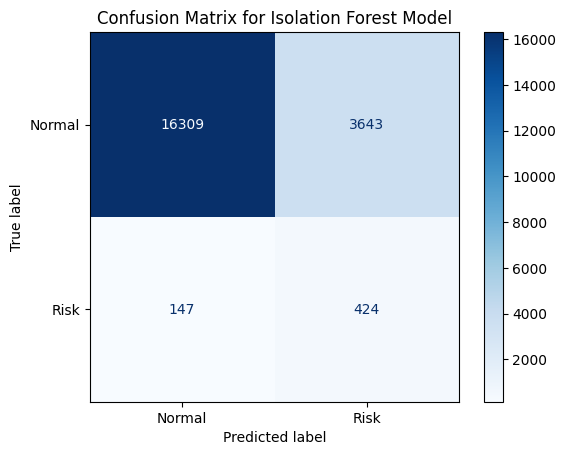

In [157]:

# confusion matrix is plotted.

cm = confusion_matrix(test_df['at_risk_event'], test_df['anomaly'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Normal', 'Risk'])


disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Isolation Forest Model')
plt.show()

In [158]:

# Precision, Recall and F1 scores are calculated on the test dataset.

precision_test = precision_score(test_df['at_risk_event'], test_df['anomaly'])
recall_test = recall_score(test_df['at_risk_event'], test_df['anomaly'])
f1_test = f1_score(test_df['at_risk_event'], test_df['anomaly'])

In [159]:
# Printing out the fetched scores.

print(f'Test F1 Score: {f1_test}')
print(f'Test Precision: {precision_test}')
print(f'Test Recall: {recall_test}')

Test F1 Score: 0.18283742992669255
Test Precision: 0.10425374969264814
Test Recall: 0.7425569176882661


In [160]:
# AUC-ROC Score
auc_roc = roc_auc_score(test_df['at_risk_event'], test_df['anomaly_score'])
print(f"AUC-ROC Score: {auc_roc}")

# AUPR Score
precision, recall, _ = precision_recall_curve(test_df['at_risk_event'], test_df['anomaly_score'])
aupr = auc(recall, precision)
print(f"AUPR Score: {aupr}")

AUC-ROC Score: 0.18444643677224637
AUPR Score: 0.015730441634218526


### ***ONE CLASS SVM***

In [161]:
len(pca_features)

15

In [162]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_df[pca_features])
X_test_scaled = scaler.fit_transform(test_df[pca_features])

In [163]:
# Define the One-Class SVM model
model = OneClassSVM(kernel='rbf', gamma=0.001, nu=0.1)

# Train the model
model.fit(X_train_scaled)         # rbf is good so far..... nu = 0.1 is good as well , gamma = 0.01 gives me a good score

OneClassSVM(gamma=0.001, nu=0.1)

In [164]:

# Calculate anomaly scores
test_df['anomaly_score_oc'] = model.decision_function(X_test_scaled)

# Predict anomalies
test_df['anomaly_oc'] = model.predict(X_test_scaled)

# Map the predictions to a more interpretable format (1 for anomaly, 0 for normal)
test_df['anomaly_oc'] = test_df['anomaly_oc'].map({1: 0, -1: 1})

<ipython-input-164-4df3d8e1254d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['anomaly_score_oc'] = model.decision_function(X_test_scaled)
<ipython-input-164-4df3d8e1254d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['anomaly_oc'] = model.predict(X_test_scaled)
<ipython-input-164-4df3d8e1254d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

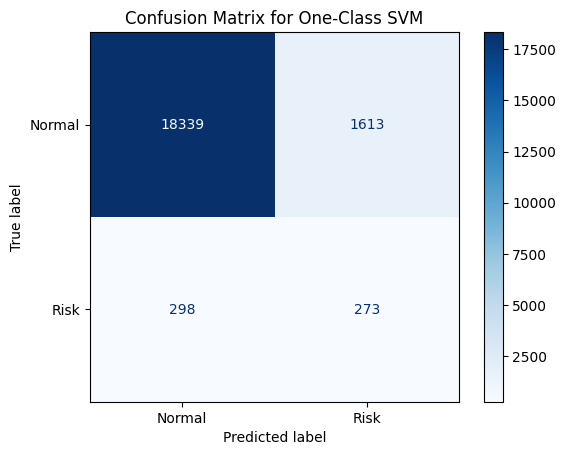

In [165]:
# Displaying the confusion matrix.

cm = confusion_matrix(test_df['at_risk_event'], test_df['anomaly_oc'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Normal', 'Risk'])


disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for One-Class SVM')
plt.show()

In [166]:
# Precision, Recall and F1 scores are calculated on the test dataset.

precision_test_oc = precision_score(test_df['at_risk_event'], test_df['anomaly_oc'])
recall_test_oc = recall_score(test_df['at_risk_event'], test_df['anomaly_oc'])
f1_test_oc = f1_score(test_df['at_risk_event'], test_df['anomaly_oc'])

In [167]:
# Printing out the fetched scores.

print(f'Test F1 Score: {f1_test_oc}')
print(f'Test Precision: {precision_test_oc}')
print(f'Test Recall: {recall_test_oc}')

Test F1 Score: 0.22222222222222218
Test Precision: 0.14475079533404028
Test Recall: 0.47810858143607704


In [168]:
# AUC-ROC Score
auc_roc = roc_auc_score(test_df['at_risk_event'], test_df['anomaly_score_oc'])
print(f"AUC-ROC Score: {auc_roc}")

# AUPR Score
precision, recall, _ = precision_recall_curve(test_df['at_risk_event'], test_df['anomaly_score_oc'])
aupr = auc(recall, precision)
print(f"AUPR Score: {aupr}")

AUC-ROC Score: 0.17602684270620772
AUPR Score: 0.015591277588609368


## ***DEEP LEARNING APPROACH***

### ***LSTM AUTOENCODERS***

In [169]:
len(pca_features) # Fetching the length of pca_features which we have acquired ( just for reaffirmation)...

15

In [170]:
# Scaling the train and test dataframes.

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_df[pca_features])
X_test_scaled = scaler.fit_transform(test_df[pca_features])

In [171]:
# Reshape the data for LSTM
timesteps = 1
X_train_scaled = X_train_scaled.reshape((X_train_scaled.shape[0], timesteps, X_train_scaled.shape[1]))
X_test_scaled = X_test_scaled.reshape((X_test_scaled.shape[0], timesteps, X_test_scaled.shape[1]))

In [172]:
X_train_scaled.shape, X_test_scaled.shape

((84719, 1, 15), (20523, 1, 15))

In [173]:
# Defining the autoencoder model.

def autoencoder_model(X):

    model = Sequential([
    LSTM(64, activation='relu', input_shape=(timesteps, X_train_scaled.shape[2]), return_sequences=True),
    LSTM(32, activation='relu', return_sequences=False),
    RepeatVector(timesteps),
    LSTM(32, activation='relu', return_sequences=True),
    LSTM(64, activation='relu', return_sequences=True),
    TimeDistributed(Dense(X_train_scaled.shape[2]))
])
    return model


In [174]:
# Call the model.
model = autoencoder_model(X_train_scaled)

# compile the model.
model.compile(optimizer=Adam(learning_rate=0.001), loss='mae')

# Printing out the summary of the model.
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 64)             20480     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 repeat_vector (RepeatVecto  (None, 1, 32)             0         
 r)                                                              
                                                                 
 lstm_2 (LSTM)               (None, 1, 32)             8320      
                                                                 
 lstm_3 (LSTM)               (None, 1, 64)             24832     
                                                                 
 time_distributed (TimeDist  (None, 1, 15)             975       
 ributed)                                               

In [175]:
X_train_scaled.shape, train_df[pca_features].shape

((84719, 1, 15), (84719, 15))

In [176]:
# Fitting the model.
nb_epochs = 25
batch_size = 64
history = model.fit(X_train_scaled, X_train_scaled, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05).history

Epoch 1/25
1258/1258 [==============================] - 18s 9ms/step - loss: 0.3047 - val_loss: 0.1475
Epoch 2/25
1258/1258 [==============================] - 9s 7ms/step - loss: 0.1276 - val_loss: 0.0926
Epoch 3/25
1258/1258 [==============================] - 10s 8ms/step - loss: 0.0881 - val_loss: 0.0709
Epoch 4/25
1258/1258 [==============================] - 8s 7ms/step - loss: 0.0706 - val_loss: 0.0512
Epoch 5/25
1258/1258 [==============================] - 10s 8ms/step - loss: 0.0508 - val_loss: 0.0386
Epoch 6/25
1258/1258 [==============================] - 9s 7ms/step - loss: 0.0442 - val_loss: 0.0343
Epoch 7/25
1258/1258 [==============================] - 9s 7ms/step - loss: 0.0371 - val_loss: 0.0214
Epoch 8/25
1258/1258 [==============================] - 11s 9ms/step - loss: 0.0238 - val_loss: 0.0193
Epoch 9/25
1258/1258 [==============================] - 8s 6ms/step - loss: 0.0207 - val_loss: 0.0189
Epoch 10/25
1258/1258 [==============================] - 10s 8ms/step - loss: 

In [177]:
# Predict the values for the training set using the trained model
X_pred = model.predict(X_train_scaled)

# Reshape the predictions to have the same shape as the input features
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])

# Convert the predictions to a DataFrame and set column names to match the original features
X_pred = pd.DataFrame(X_pred, columns=train_df[pca_features].columns)

# Ensure the index of the predictions matches the index of the original training data
X_pred.index = train_df[pca_features].index

2648/2648 [==============================] - 8s 3ms/step


In [178]:
# Create a DataFrame to store the reconstruction error scores
scored = pd.DataFrame(index=train_df[pca_features].index)

# Reshape the original training data to have the same shape as the predictions
Xtrain = X_train_scaled.reshape(X_train_scaled.shape[0], X_train_scaled.shape[2])

# Calculate the Mean Absolute Error (MAE) loss for each sample
train_mae_loss = np.mean(np.abs(X_pred-Xtrain), axis = 1)

# Store the MAE loss in the 'scored' DataFrame
scored['Loss_mae'] = train_mae_loss

In [179]:
# Finding out the threshold and storing it with the help of train data loss.
threshold = np.percentile(train_mae_loss, 95)
threshold

0.03404450433645318

In [180]:
# Predict the values for the test set using the trained model
X_pred = model.predict(X_test_scaled)

# Reshape the predictions to have the same shape as the input features
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])

# Convert the predictions to a DataFrame and set column names to match the original features
X_pred = pd.DataFrame(X_pred, columns=test_df[pca_features].columns)

# Ensure the index of the predictions matches the index of the original test data
X_pred.index = test_df[pca_features].index

642/642 [==============================] - 2s 2ms/step


In [181]:
# Create a DataFrame to store the reconstruction error scores
scored = pd.DataFrame(index=test_df[pca_features].index)

# Reshape the original test data to have the same shape as the predictions
Xtest = X_test_scaled.reshape(X_test_scaled.shape[0], X_test_scaled.shape[2])

# Calculate the Mean Absolute Error loss for each sample
test_mae_loss = np.mean(np.abs(X_pred-Xtest), axis = 1)

# Store the MAE loss in the scored DataFrame
scored['Loss_mae'] = test_mae_loss

In [182]:
# Add the threshold value to the 'scored' DataFrame
scored['Threshold'] = threshold

# Determine if each sample is an anomaly based on the MAE loss and threshold
scored['Anomaly'] = scored['Loss_mae'] > scored['Threshold']
scored.head()

,Loss_mae,Threshold,Anomaly
104,0.041823,0.034045,True
105,0.033860,0.034045,False
106,0.027657,0.034045,False
107,0.019354,0.034045,False
108,0.017231,0.034045,False


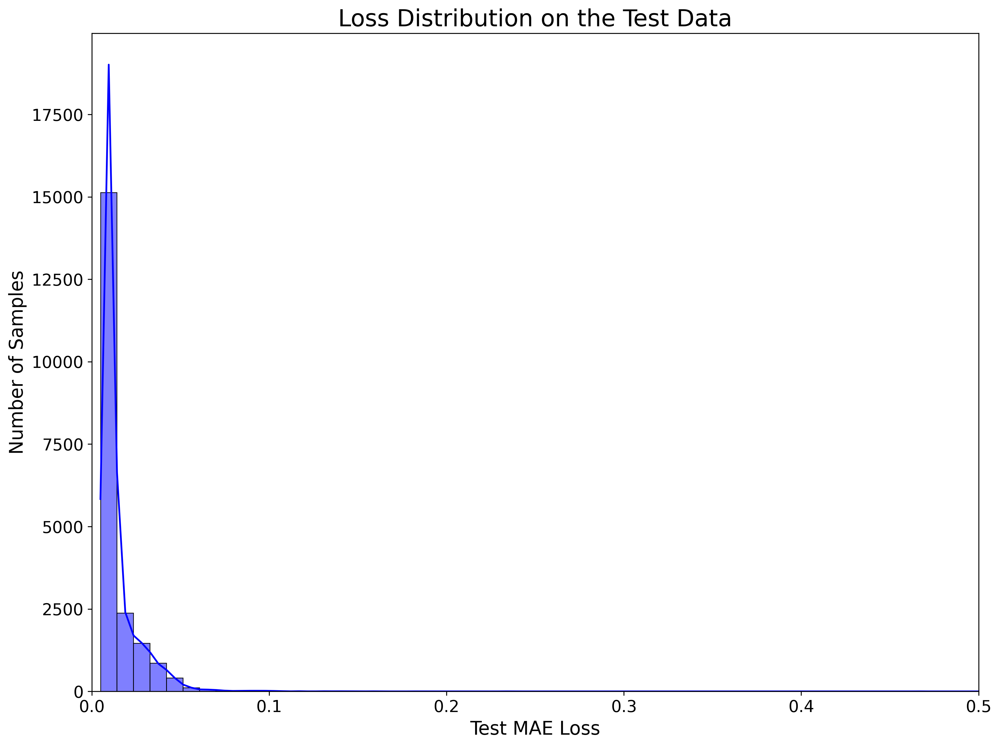

In [183]:
# Plotting the Loss Distribution

plt.figure(figsize=(12, 9), dpi=300)  # High DPI for better PDF quality
plt.title('Loss Distribution on the Test Data', fontsize=20)
sns.histplot(scored['Loss_mae'], bins=100, kde=True, color='blue')
plt.xlim([0.0, 0.5])
plt.xlabel('Test MAE Loss', fontsize=16)
plt.ylabel('Number of Samples', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()  # Adjusts plot to ensure everything fits without overlapping


# Show the plot
plt.show()

In [184]:
scored

,Loss_mae,Threshold,Anomaly
104,0.041823,0.034045,True
105,0.033860,0.034045,False
106,0.027657,0.034045,False
107,0.019354,0.034045,False
108,0.017231,0.034045,False
...,...,...,...
104897,0.011945,0.034045,False
104898,0.015883,0.034045,False
104899,0.010004,0.034045,False
104900,0.022455,0.034045,False


In [185]:
# Calculating the precision, recall and F1 scores.

precision_test = precision_score(test_df['at_risk_event'], scored['Anomaly'])
recall_test = recall_score(test_df['at_risk_event'], scored['Anomaly'])
f1_test = f1_score(test_df['at_risk_event'], scored['Anomaly'])

In [186]:
# Printing out the calculated scores.

print(f'Test Precision: {precision_test}')
print(f'Test Recall: {recall_test}')
print(f'Test F1 Score: {f1_test}')

Test Precision: 0.11667859699355762
Test Recall: 0.28546409807355516
Test F1 Score: 0.16565040650406504


In [187]:
# AUC-ROC Score
auc_roc = roc_auc_score(test_df['at_risk_event'],test_mae_loss)
print(f"AUC-ROC Score: {auc_roc}")

# AUPR Score
precision, recall, _ = precision_recall_curve(test_df['at_risk_event'], test_mae_loss)
aupr = auc(recall, precision)
print(f"AUPR Score: {aupr}")

AUC-ROC Score: 0.8050257570884659
AUPR Score: 0.14946774851857086


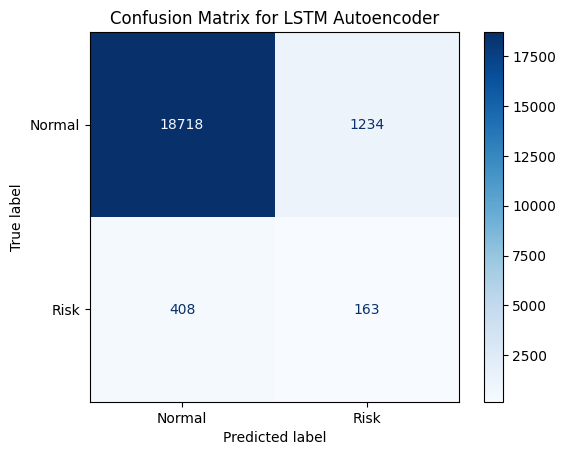

In [188]:
# Plotting the confusion matrix.

cm = confusion_matrix(test_df['at_risk_event'], scored['Anomaly'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Normal', 'Risk'])
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for LSTM Autoencoder')
plt.show()